In [1]:
import anndata as ad
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=120, facecolor='white')

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.20.3 scipy==1.7.3 pandas==1.4.1 scikit-learn==1.0.2 statsmodels==0.12.2 python-igraph==0.9.9 pynndescent==0.5.6


In [2]:
!pwd

/store/Projects/pantovski/Pre-processing_clustering_annotation


In [3]:
AC1 = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_transplanted_separate/data/Ambient_RNA_Cleaned/AC1_cleaned.h5ad')
AC2 = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_transplanted_separate/data/Ambient_RNA_Cleaned/AC2_cleaned.h5ad')
AC3 = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_transplanted_separate/data/Ambient_RNA_Cleaned/AC3_cleaned.h5ad')
AC4 = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_transplanted_separate/data/Ambient_RNA_Cleaned/AC4_cleaned.h5ad')
AC5 = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_transplanted_separate/data/Ambient_RNA_Cleaned/AC5_cleaned.h5ad')
AC6 = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_transplanted_separate/data/Ambient_RNA_Cleaned/AC6_cleaned.h5ad')
AC7 = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_transplanted_separate/data/Ambient_RNA_Cleaned/AC7_cleaned.h5ad')
AC8 = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_transplanted_separate/data/Ambient_RNA_Cleaned/AC8_cleaned.h5ad')
AC9 = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_transplanted_separate/data/Ambient_RNA_Cleaned/AC9_cleaned.h5ad')
AC10 = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_transplanted_separate/data/Ambient_RNA_Cleaned/AC10_cleaned.h5ad')

AC1.var_names_make_unique()
AC2.var_names_make_unique()
AC3.var_names_make_unique()
AC4.var_names_make_unique()
AC5.var_names_make_unique()
AC6.var_names_make_unique()
AC7.var_names_make_unique()
AC8.var_names_make_unique()
AC9.var_names_make_unique()
AC10.var_names_make_unique()

AC1.obs.index = AC1.obs.index.map(lambda x: x.split('-')[0]+'-1')
AC2.obs.index = AC2.obs.index.map(lambda x: x.split('-')[0]+'-2')
AC3.obs.index = AC3.obs.index.map(lambda x: x.split('-')[0]+'-3')
AC4.obs.index = AC4.obs.index.map(lambda x: x.split('-')[0]+'-4')
AC5.obs.index = AC5.obs.index.map(lambda x: x.split('-')[0]+'-5')
AC6.obs.index = AC6.obs.index.map(lambda x: x.split('-')[0]+'-6')
AC7.obs.index = AC7.obs.index.map(lambda x: x.split('-')[0]+'-7')
AC8.obs.index = AC8.obs.index.map(lambda x: x.split('-')[0]+'-8')
AC9.obs.index = AC9.obs.index.map(lambda x: x.split('-')[0]+'-9')
AC10.obs.index = AC10.obs.index.map(lambda x: x.split('-')[0]+'-10')

Young_transplanted_separate_Ambient_RNA_cleaned_join_inner = ad.concat([AC1, AC2, AC3, AC4, AC5, AC6, AC7, AC8, AC9, AC10], label="batch", keys=["AC1", "AC2", "AC3", "AC4", "AC5", "AC6", "AC7", "AC8", "AC9", "AC10"], join="inner")
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.obs.loc[Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.obs.batch.isin(["AC1", "AC2", "AC3", "AC4", "AC5", "AC6", "AC7", "AC8", "AC9", "AC10"]), 'Type'] = 'Young_transplanted_separate'

In [4]:
adata_Il10RN = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner[(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.to_df()['Il10ra'] == 0), :]
adata_Il10 = adata_Il10RN[(adata_Il10RN.to_df()['Il10'] > 0), :]
adata_Il10N = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner[(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.to_df()['Il10'] == 0), :]
adata_Il10ra = adata_Il10N[(adata_Il10N.to_df()['Il10ra'] > 0), :]
adata_DN = adata_Il10N[(adata_Il10N.to_df()['Il10ra'] == 0), :]
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner = ad.concat([adata_Il10, adata_Il10ra, adata_DN], label="IL10", keys=["IL10_Young_transplanted_separate", "IL10ra_Young_transplanted_separate", "DN_Young_transplanted_separate"])

In [5]:
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner

AnnData object with n_obs × n_vars = 110080 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Type', 'IL10'

normalizing counts per cell
    finished (0:00:02)


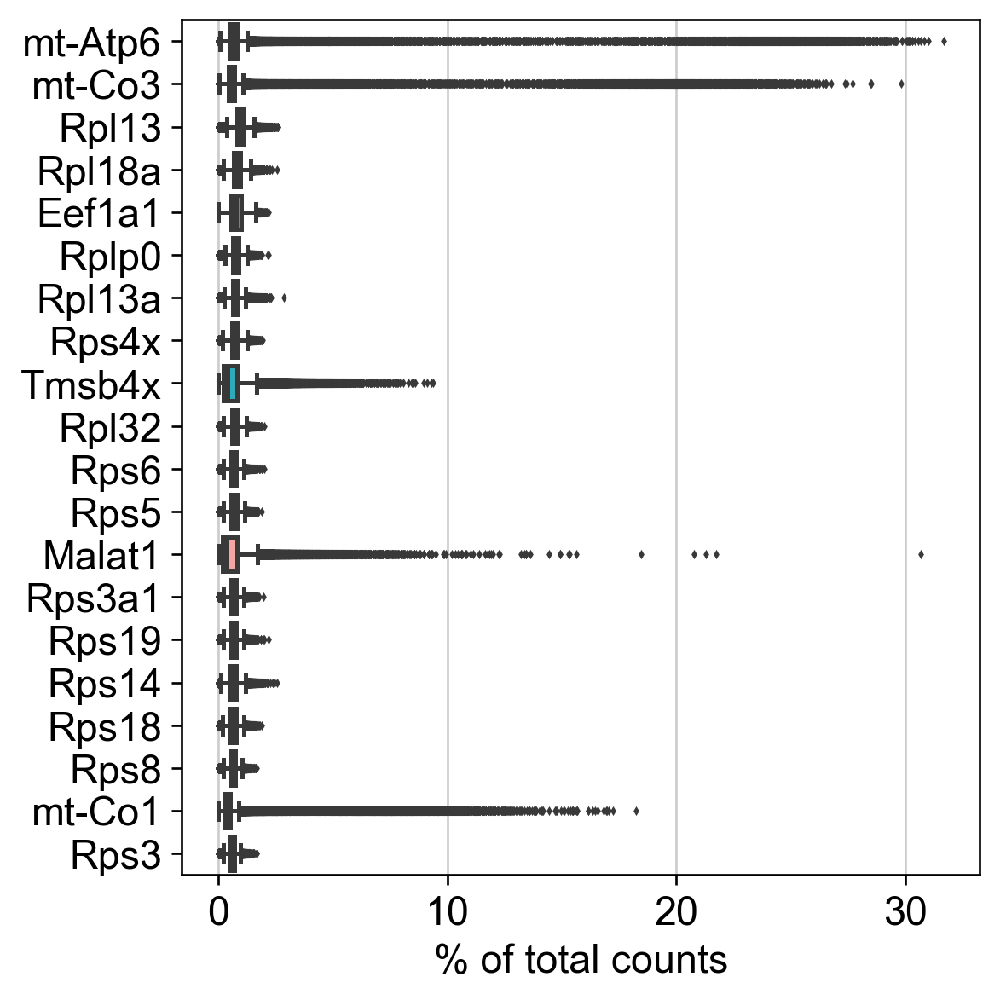

In [6]:
sc.pl.highest_expr_genes(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner, n_top=20)

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'Type' as categorical


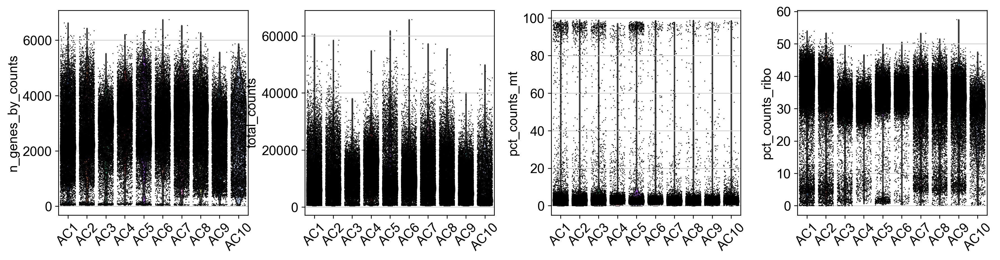

In [7]:
# mitochondrial genes
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.var['mt'] = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.var_names.str.startswith('mt-') 
# ribosomal genes
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.var['ribo'] = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.var_names.str.startswith(("Rps","Rpl"))

sc.pp.calculate_qc_metrics(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)

# A violin plot of some of the computed quality measures:
#     the number of genes expressed in the count matrix
#     the total counts per cell
#     the percentage of counts in mitochondrial genes
#     the percentage of counts in ribosomal genes
sc.pl.violin(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], jitter=0.4, groupby = 'batch', rotation= 45)

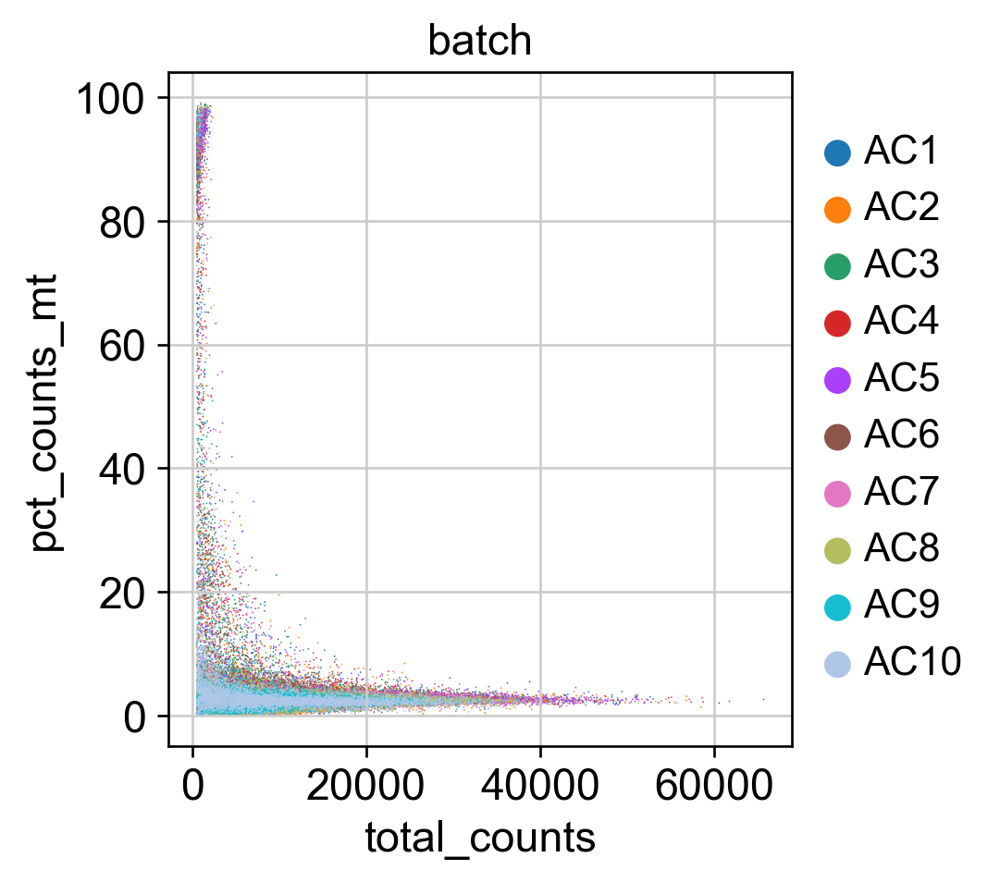

In [8]:
sc.pl.scatter(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner, x='total_counts', y='pct_counts_mt', color='batch')

In [9]:
#Basic filtering:
sc.pp.filter_cells(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner, min_genes=200)
sc.pp.filter_genes(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner, min_cells=3)

filtered out 1898 cells that have less than 200 genes expressed
filtered out 11825 genes that are detected in less than 3 cells


In [10]:
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.shape

(108182, 20460)

In [11]:
# Remove cells that have too many mitochondrial genes expressed or too little ribosomal genes expressed:
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner[Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.obs.pct_counts_mt < 10, :]
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner[Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.obs.pct_counts_ribo > 5, :]

In [12]:
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.shape

(104958, 20460)

Trying to set attribute `.var` of view, copying.


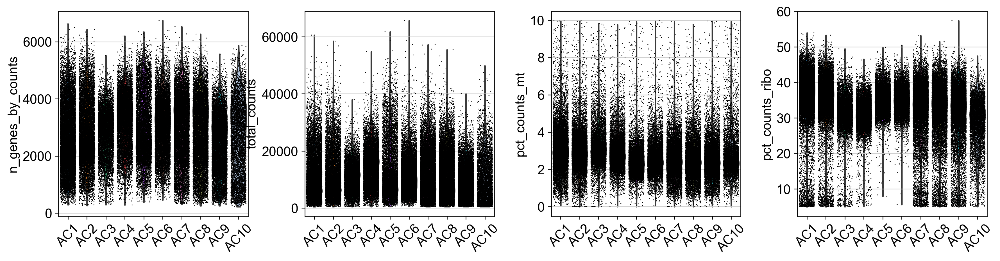

In [13]:
# mitochondrial genes
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.var['mt'] = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.var_names.str.startswith('mt-') 
# ribosomal genes
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.var['ribo'] = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.var_names.str.startswith(("Rps","Rpl"))

sc.pp.calculate_qc_metrics(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)

sc.pl.violin(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], jitter=0.4, groupby = 'batch', rotation= 45)

In [14]:
np.median(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.obs.n_genes_by_counts)

2827.5

In [15]:
from statsmodels import robust
robust.mad(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.obs.n_genes_by_counts)

1146.7928160140832

In [16]:
# Young_transplanted_separate_Ambient_RNA_cleaned_join_inner = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner[Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.obs.n_genes_by_counts > 1000, :]

In [17]:
# As the level of expression of mitochondrial genes and Malat1 are judged as mainly technical, it can be wise to remove them from the dataset bofore any further analysis.
malat1 = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.var_names.str.startswith('Malat1')
Gm42418 = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.var_names.str.startswith('Gm42418')
mito_genes = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner.var_names.str.startswith('mt-')

remove = np.add(mito_genes, malat1)
remove = np.add(remove, Gm42418)

keep = np.invert(remove)

Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner[:,keep]

In [18]:
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt.shape

(104958, 20445)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...


Trying to set attribute `.obs` of view, copying.


Automatically set threshold at doublet score = 0.38
Detected doublet rate = 2.0%
Estimated detectable doublet fraction = 39.0%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 5.1%
Elapsed time: 275.8 seconds


(<Figure size 960x360 with 2 Axes>,
 array([<AxesSubplot:title={'center':'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <AxesSubplot:title={'center':'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

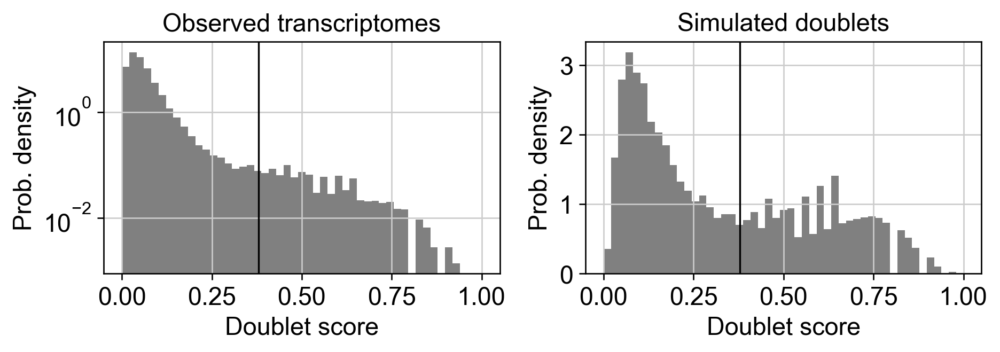

In [20]:
# Predict doublets
scrub = scr.Scrublet(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt.X)
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt.obs['doublet_scores'], Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt.obs['predicted_doublets'] = scrub.scrub_doublets()
scrub.plot_histogram()

In [21]:
sum(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt.obs['predicted_doublets'])

2078

In [22]:
# add in column with singlet/doublet instead of True/False
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt.obs['doublet_info'] = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt.obs["predicted_doublets"].astype(str)
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt[Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt.obs['doublet_info'] == 'False',:]

In [23]:
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt.shape

(102880, 20445)

In [24]:
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt.obs.pop('doublet_info')
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt.obs.pop('doublet_scores')
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt.obs.pop('predicted_doublets')

ACTGTCCTCTGGAGCC-1     False
ATCATCTGTAAATACG-1     False
ATTACTCGTTCCCTTG-1     False
CAGATCAAGCAGCCTC-1     False
CAGCTGGAGGGAGTAA-1     False
                       ...  
TTTGTCAAGTGGAGTC-10    False
TTTGTCACAATAGAGT-10    False
TTTGTCAGTTCAGGCC-10    False
TTTGTCATCAATCACG-10    False
TTTGTCATCTCCGGTT-10    False
Name: predicted_doublets, Length: 102880, dtype: bool

In [25]:
# Save the result.
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt.write('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_nonlognorm_join_inner_200_3_10_5_scrublet_no_mt_raw.h5ad')

In [26]:
import anndata as ad
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=120, facecolor='white')

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.20.3 scipy==1.7.3 pandas==1.4.1 scikit-learn==1.0.2 statsmodels==0.12.2 python-igraph==0.9.9 pynndescent==0.5.6


In [27]:
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_nonlognorm_join_inner_200_3_10_5_scrublet_no_mt_raw.h5ad')

In [28]:
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt[:, ((Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt.X > 2).sum(axis=0) / Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt.shape[0] ) > 0.05]

In [29]:
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent

View of AnnData object with n_obs × n_vars = 102880 × 2454
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Type', 'IL10', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'batch_colors'

In [30]:
# Total-count normalize (library-size correct) the data matrix X to 10,000 reads per cell, so that counts become comparable among cells.
sc.pp.normalize_total(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt, target_sum=1e4)

# Logarithmize the data:
sc.pp.log1p(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt)

normalizing counts per cell
    finished (0:00:01)


extracting highly variable genes
    finished (0:00:08)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


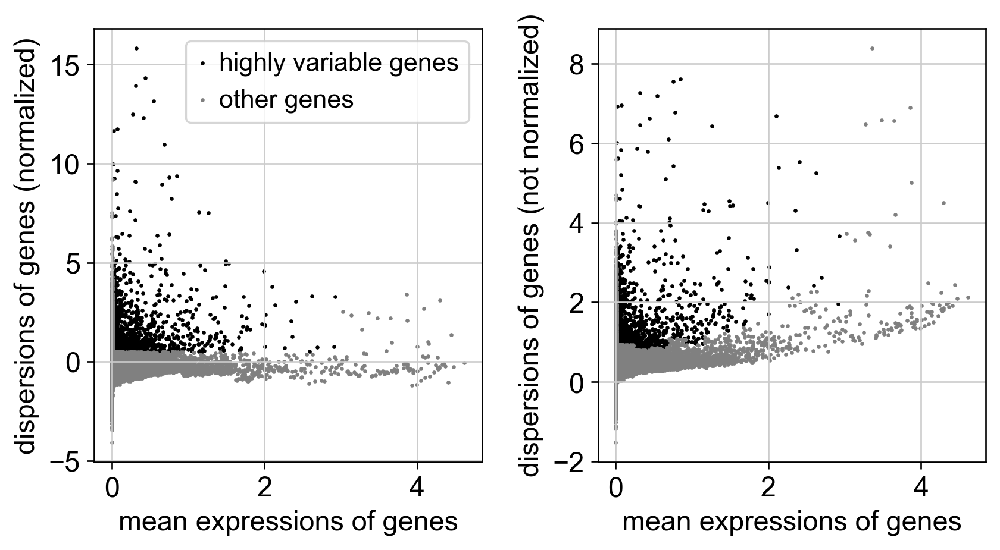

In [31]:
# Identify highly-variable genes.
sc.pp.highly_variable_genes(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt, min_mean=0.0125, max_mean=3, min_disp=0.5)

sc.pl.highly_variable_genes(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt)

In [32]:
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent

View of AnnData object with n_obs × n_vars = 102880 × 2454
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Type', 'IL10', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'batch_colors'

In [33]:
# Set the .raw attribute of the AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt.raw = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt

#Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent

# The result of the previous highly-variable-genes detection is mntd as an annotation in .var.highly_variable and auto-detected by PCA and hence, sc.pp.neighbors and subsequent manifYoung/graph tools. In that case, the step actually do the filtering below is unnecessary, too.

# Actually do the filtering
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt[:, Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent.var.index]

#Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_hvgo_regress = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent[:, Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent.var.highly_variable]

# Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.
sc.pp.regress_out(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use


/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:7: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,
/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:7: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,


    finished (0:02:10)


In [34]:
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress

AnnData object with n_obs × n_vars = 102880 × 2454
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Type', 'IL10', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'log1p', 'hvg'

In [35]:
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress
# BATCH CORRECTION USING ComBat
# run combat
sc.pp.combat(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, key='batch')

Standardizing Data across genes.

Found 10 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data



In [36]:
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat

AnnData object with n_obs × n_vars = 102880 × 2454
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Type', 'IL10', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'log1p', 'hvg'

In [37]:
# Save the result.
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.write('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_lognorm_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR.h5ad')

In [38]:
# PCA, TSNE, UMAP and Clustering

In [210]:
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_lognorm_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR.h5ad')
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.raw = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat

df = pd.read_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_cell_types_lognorm_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR.csv", index_col=0)
labels = df['labels']
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.obs['cell_type'] = labels
pd.crosstab(index=Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.obs.batch, columns=Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.obs.cell_type)

cell_type,CLP,CMP,Flk2n,Flk2p,GMP,HSC,MEP
batch,,,,,,,
AC1,256,1806,1340,374,3807,6658,843
AC2,212,1236,1046,258,2824,4934,687
AC3,55,1028,298,399,5358,217,187
AC4,37,1373,90,127,8078,11,98
AC5,45,3299,783,459,23,247,4108
AC6,1201,5026,754,2916,527,36,412
AC7,1114,2034,284,356,6711,158,723
AC8,1216,1925,310,325,6629,146,714
AC9,1112,1935,251,325,6724,132,683


In [211]:
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.raw = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.write('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_lognorm_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR.h5ad')

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cell_type' as categorical


In [212]:
# Scale each gene to unit variance. Clip values exceeding standard deviation 10.
sc.pp.scale(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, max_value=10)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)


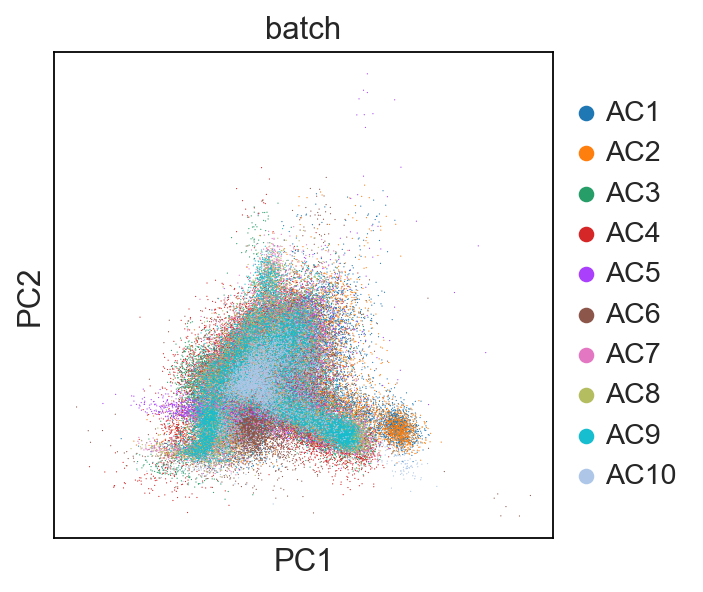

In [213]:
# Principal component analysis

# Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.
sc.tl.pca(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, svd_solver='arpack')

# We can make a scatter plot in the PCA coordinates, but we will not use that later on.
sc.pl.pca(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, color='batch')

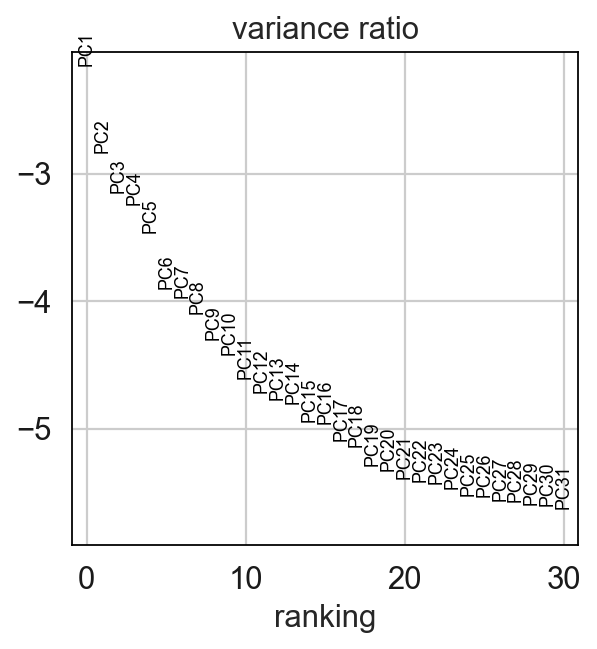

In [214]:
# Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function sc.tl.louvain() or tSNE sc.tl.tsne(). In our experience, often a rough estimate of the number of PCs does fine.
sc.pl.pca_variance_ratio(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, log=True)

In [215]:
# Computing the neighborhood graph

#Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. For the sake of reproducing Seurat’s results, let’s take the following values.
sc.pp.neighbors(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, n_neighbors=15, n_pcs=45)

computing neighbors
    using 'X_pca' with n_pcs = 45
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)


computing tSNE
    using 'X_pca' with n_pcs = 30
    using sklearn.manifold.TSNE


/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:07:23)


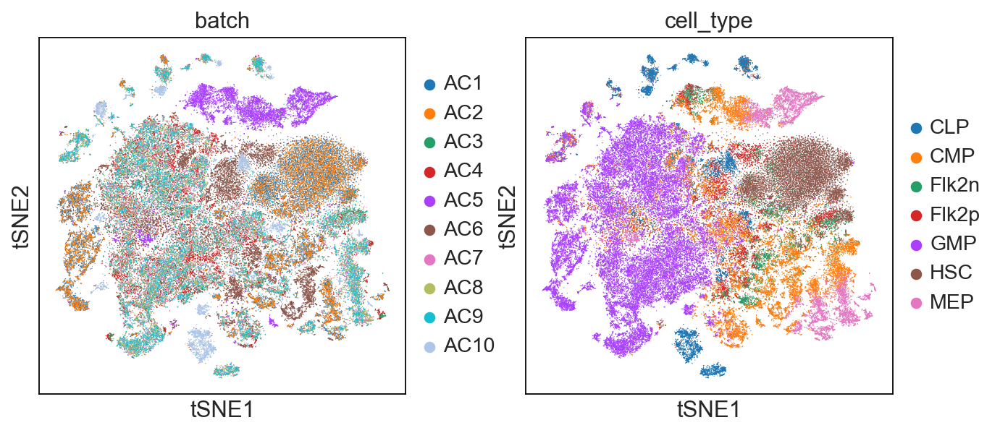

In [216]:
sc.tl.tsne(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, n_pcs = 30)

sc.pl.tsne(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, color=['batch', 'cell_type'])

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:09)


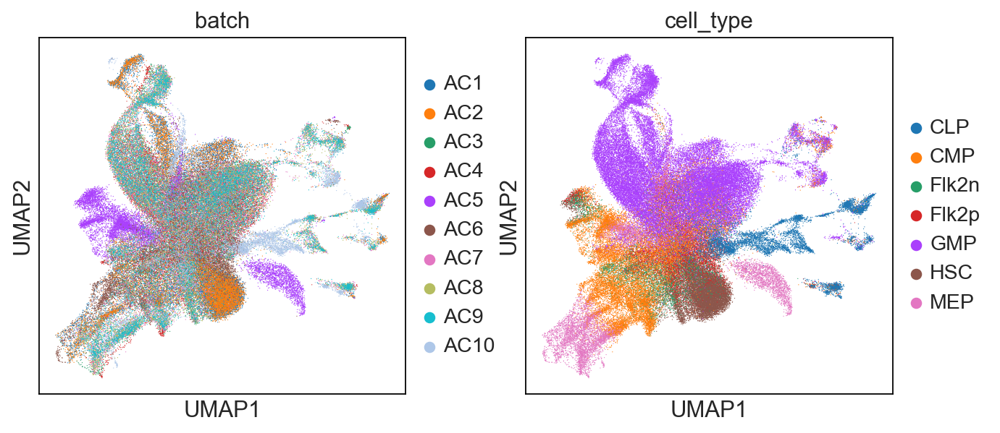

In [217]:
# Embedding the neighborhood graph

# We suggest embedding the graph in two dimensions using UMAP (McInnes et al., 2018), see below. It is potentially more faithful to the global connectivity of the manifYoung than tSNE, i.e., it better preserves trajectories. In some ocassions, you might still observe disconnected clusters and similar connectivity violations. They can usually be remedied by running:

# tl.paga(adata)
# pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
# tl.umap(adata, init_pos='paga')

sc.tl.umap(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat)

sc.pl.umap(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, color=['batch', 'cell_type'])

running Leiden clustering
    finished: found 10 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:37)


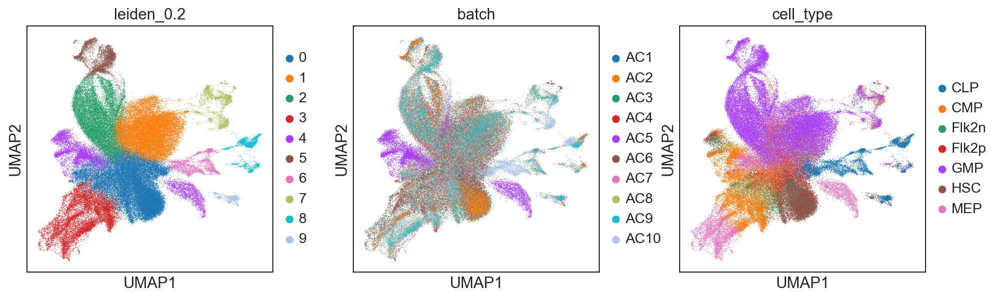

In [218]:
# Clustering the neighborhood graph

# As with Seurat and many other frameworks, we recommend the Leiden graph-clustering method (community detection based on optimizing modularity) by Traag *et al.* (2018). Note that Leiden clustering directly clusters the neighborhood graph of cells, which we already computed in the previous section.
sc.tl.leiden(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, resolution = 0.2, key_added = "leiden_0.2")

# Plot the clusters:
sc.pl.umap(Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, color=['leiden_0.2', 'batch', 'cell_type'])

In [219]:
#Save the clusters.
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.obs.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_clusters_join_inner_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR_raw_SingleR.csv")

In [220]:
# Save the result.
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.write('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR_raw_SingleR.h5ad')

In [1]:
# DGE

import numpy as np
import pandas as pd
import scanpy as sc

In [2]:
Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR_raw_SingleR.h5ad')

Young_transplanted_separate_Ambient_RNA_cleaned_HSC = Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat[Young_transplanted_separate_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.obs.cell_type == 'HSC']
Young_transplanted_separate_Ambient_RNA_cleaned_HSC.obs

,orig.ident,nCount_RNA,nFeature_RNA,batch,Type,IL10,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,n_genes,cell_type,leiden_0.2
ACTGTCCTCTGGAGCC-1,0,7278.171249,2479,AC1,Young_transplanted_separate,IL10_Young_transplanted_separate,2479,7278.171387,225.246292,3.094820,2839.862549,39.018902,2479,HSC,0
ATTACTCGTTCCCTTG-1,0,6679.062587,2505,AC1,Young_transplanted_separate,IL10_Young_transplanted_separate,2505,6679.062988,193.880844,2.902815,2081.980469,31.171745,2505,HSC,0
CAGCTGGAGGGAGTAA-1,0,18238.870453,2803,AC1,Young_transplanted_separate,IL10_Young_transplanted_separate,2801,18236.867188,263.632507,1.445602,2774.324463,15.212725,2803,HSC,8
CCATGTCCACACCGCA-1,0,4841.369263,1773,AC1,Young_transplanted_separate,IL10_Young_transplanted_separate,1773,4841.369629,341.179504,7.047169,1765.897339,36.475163,1773,HSC,0
CTAGCCTAGTGGAGTC-1,0,8374.605442,2486,AC1,Young_transplanted_separate,IL10_Young_transplanted_separate,2486,8374.605469,232.930481,2.781391,3822.786377,45.647362,2486,HSC,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGTATTCTCGATCCCT-10,0,4915.884741,2110,AC10,Young_transplanted_separate,DN_Young_transplanted_separate,2110,4915.884766,123.166656,2.505483,1507.398438,30.663828,2110,HSC,0
TTAGTTCCATTTGCCC-10,0,7349.399963,2652,AC10,Young_transplanted_separate,DN_Young_transplanted_separate,2652,7349.399902,151.259933,2.058126,2618.210938,35.624825,2652,HSC,3
TTCTCAACATGGTTGT-10,0,5553.972523,2290,AC10,Young_transplanted_separate,DN_Young_transplanted_separate,2290,5553.972656,109.671692,1.974653,1724.267212,31.045654,2290,HSC,0
TTGCGTCCACAAGACG-10,0,635.158304,384,AC10,Young_transplanted_separate,DN_Young_transplanted_separate,384,635.158325,15.503089,2.440823,155.721252,24.516920,384,HSC,7


In [3]:
pd.crosstab(index=Young_transplanted_separate_Ambient_RNA_cleaned_HSC.obs.batch, columns=Young_transplanted_separate_Ambient_RNA_cleaned_HSC.obs.IL10)

IL10,IL10_Young_transplanted_separate,IL10ra_Young_transplanted_separate,DN_Young_transplanted_separate
batch,,,
AC1,6,82,6570
AC2,6,86,4842
AC3,0,1,216
AC4,0,0,11
AC5,1,3,243
AC6,0,0,36
AC7,0,1,157
AC8,0,2,144
AC9,2,2,128


In [4]:
expression_matrix = pd.DataFrame(Young_transplanted_separate_Ambient_RNA_cleaned_HSC.X)
expression_matrix.columns = Young_transplanted_separate_Ambient_RNA_cleaned_HSC.var.index
expression_matrix = expression_matrix.T
gene_list = list(Young_transplanted_separate_Ambient_RNA_cleaned_HSC.var.index)
column_values = pd.Series(gene_list)
expression_matrix.insert(loc=0, column='Description', value=column_values)
expression_matrix.insert(loc=0, column='NAME', value=gene_list)
expression_matrix['NAME'] = expression_matrix['NAME'].str.upper()
expression_matrix.index = range(len(expression_matrix.index))

expression_matrix.to_csv('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_HSC_expression_matrix_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.txt', index=None, sep='\t', mode='a')

In [5]:
phenotype_list = list(Young_transplanted_separate_Ambient_RNA_cleaned_HSC.obs.IL10)
first_row = [Young_transplanted_separate_Ambient_RNA_cleaned_HSC.shape[0], '3', '1']
second_row = ['#', 'IL10_Young_transplanted_separate', 'IL10ra_Young_transplanted_separate', 'DN_Young_transplanted_separate']

import csv

with open('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_HSC_phenotype_list_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.cls', 'w') as f:
      
    # using csv.writer method from CSV package
    write = csv.writer(f, delimiter=' ')
      
    write.writerow(first_row)
    write.writerow(second_row)
    write.writerow(phenotype_list)

In [6]:
import gseapy as gp
gene_set_names = gp.get_library_name(organism='Mouse')

In [7]:
groups = ['IL10ra_Young_transplanted_separate', 'DN_Young_transplanted_separate']
IL10ra_vs_DN_GSEA = Young_transplanted_separate_Ambient_RNA_cleaned_HSC[Young_transplanted_separate_Ambient_RNA_cleaned_HSC.obs.IL10.isin(groups)]

In [8]:
expression_matrix_IL10ra_vs_DN = pd.DataFrame(IL10ra_vs_DN_GSEA.X)
expression_matrix_IL10ra_vs_DN.columns = IL10ra_vs_DN_GSEA.var.index
expression_matrix_IL10ra_vs_DN = expression_matrix_IL10ra_vs_DN.T
gene_list = list(IL10ra_vs_DN_GSEA.var.index)
column_values = pd.Series(gene_list)
expression_matrix_IL10ra_vs_DN.insert(loc=0, column='Description', value=column_values)
expression_matrix_IL10ra_vs_DN.insert(loc=0, column='NAME', value=gene_list)
expression_matrix_IL10ra_vs_DN['NAME'] = expression_matrix_IL10ra_vs_DN['NAME'].str.upper()
expression_matrix_IL10ra_vs_DN.index = range(len(expression_matrix_IL10ra_vs_DN.index))

In [9]:
phenotype_list_IL10ra_vs_DN = list(IL10ra_vs_DN_GSEA.obs.IL10)

In [10]:
gs_res_IL10ra_vs_DN = gp.gsea(data=expression_matrix_IL10ra_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Biological_Process_2021', # enrichr library names
                 cls= phenotype_list_IL10ra_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png',)

#access the dataframe results throught res2d attribute
gs_res_IL10ra_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN_GSEA_GO_BP_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv', index=None)

significant_terms = gs_res_IL10ra_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:34:49,032 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,cellular response to starvation (GO:0009267),0.572467,1.993799,0.000000,0.031566,158,33,XBP1;GABARAP;MAP1LC3B;HSPA8;GABARAPL1;ATP6V0B;...,XBP1;GABARAP;MAP1LC3B;HSPA8;GABARAPL1;ATP6V0B;...
1,response to cytokine (GO:0034097),0.594826,2.012256,0.000000,0.055240,150,23,IFITM1;IFITM3;IFITM2;IGBP1;PTPN18;CD74;TLE5;MA...,IFITM1;IFITM3;IFITM2;IGBP1;PTPN18;CD74;TLE5;MA...
2,cellular response to transforming growth facto...,0.606093,1.837852,0.000000,0.104166,114,16,JUN;FKBP1A;UBC;PDCD5;UBB;MEF2C;UBA52;ZYX;RPS27...,JUN;FKBP1A;UBC;PDCD5;UBB;MEF2C
3,supramolecular fiber organization (GO:0097435),0.553598,1.845650,0.000000,0.118371,351,30,B2M;ITM2B;RAC2;FKBP1A;UBC;UBB;CST3;CIB1;ALDOA;...,B2M;ITM2B;RAC2;FKBP1A;UBC;UBB;CST3;CIB1;ALDOA;...
4,RNA processing (GO:0006396),-0.440311,-1.847453,0.000000,0.125872,179,83,NONO;SF3B4;SMU1;SF3B1;SRSF11;SF3B3;PPP2CA;RNPS...,PABPC4;U2AF1;ZMAT5;SNRPD1;MRPL44;PPP2R1A;LSM1;...
5,regulation of cell migration (GO:0030334),0.506648,1.784093,0.000000,0.138100,408,38,IFITM1;CITED2;XBP1;CTSH;PDCD10;SDCBP;DDRGK1;TM...,IFITM1;CITED2;XBP1;CTSH;PDCD10;SDCBP;DDRGK1;TM...
6,chromatin remodeling (GO:0006338),-0.515223,-1.853309,0.000000,0.139059,103,33,CHRAC1;ATRX;RBBP4;HDAC1;CHD4;SMARCD2;HNRNPC;PO...,RUVBL1;NUDT5;PIH1D1;BAZ1A;TOP1;BAZ1B;ARID1A;SM...
7,pattern recognition receptor signaling pathway...,0.659789,1.847673,0.000000,0.155198,61,16,UBC;CTSB;UBB;TIFA;S100A1;UNC93B1;MAPKAPK3;UBA5...,UBC;CTSB;UBB;TIFA;S100A1;UNC93B1;MAPKAPK3;UBA5...
8,mitotic spindle organization (GO:0007052),-0.502796,-1.794768,0.000000,0.164404,157,45,RPS27;RAB11A;SEC13;PAFAH1B1;SEH1L;DYNLL1;PTPA;...,AURKA;CDCA8;CDC20;PMF1;DYNLL2;CCNB1;TPX2;KPNB1...
9,DNA replication-independent nucleosome assembl...,-0.595430,-1.853888,0.000000,0.173823,39,18,ATRX;RBBP4;NPM1;ASF1B;UBN1;HJURP;RUVBL1;HAT1;S...,CENPS;RBBP7;MIS18A;ASF1A;CENPW;CENPX;NASP;CENP...


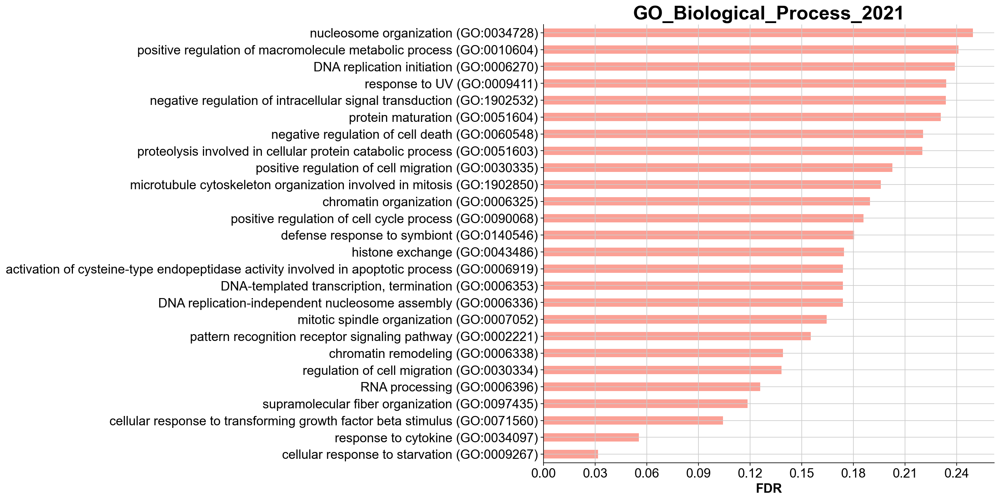

In [11]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10ra vs DN GSEA GO BP.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10))

In [12]:
gs_res_IL10ra_vs_DN = gp.gsea(data=expression_matrix_IL10ra_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Molecular_Function_2021', # enrichr library names
                 cls= phenotype_list_IL10ra_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10ra_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN_GSEA_GO_MF_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10ra_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:35:19,546 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,calcium ion binding (GO:0005509),0.477066,1.839214,0.0,0.031069,348,38,S100A11;TPT1;S100A13;IQGAP1;ANXA5;ANXA7;CIB1;S...,S100A11;TPT1;S100A13;IQGAP1;ANXA5;ANXA7;CIB1;S...
1,magnesium ion binding (GO:0000287),-0.581973,-1.843904,0.0,0.048426,146,24,PDCD6;UBA2;STK11;PLSCR3;RHEB;PAPOLA;FEN1;IDH1;...,PPA1;IDH2;TKT;YDJC;DCTPP1;TOP2A;DUT;RAN
2,mRNA binding (GO:0003729),-0.379041,-1.631687,0.0,0.208232,263,99,RPL7;PKM;RPS14;CIRBP;RPL26;YTHDF2;UPF3B;SF1;RP...,TARDBP;SHMT2;YTHDC1;G3BP1;EIF2A;EIF4A1;CPSF6;K...


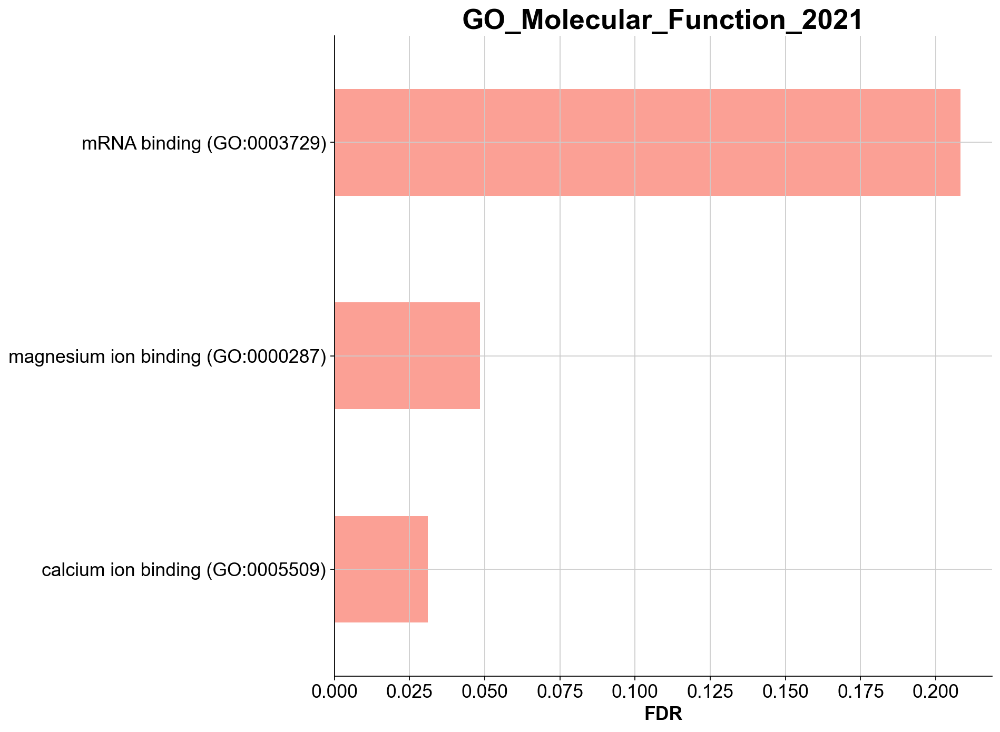

In [13]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10ra vs DN GSEA GO MF.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10))

In [14]:
gs_res_IL10ra_vs_DN = gp.gsea(data=expression_matrix_IL10ra_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Cellular_Component_2021', # enrichr library names
                 cls= phenotype_list_IL10ra_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10ra_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN_GSEA_GO_CC_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10ra_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:35:39,712 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,nuclear membrane (GO:0031965),-0.549480,-2.029174,0.000000,0.009283,204,39,SDCBP;ALOX5AP;SUMO1;TPR;YEATS4;EMD;BCL2;YBX1;M...,LBR;MFSD10;LMNB1;CCND2;AEN;TRIM27;GAPDH;JPT1;U...
1,endosome membrane (GO:0010008),0.503907,2.025712,0.000000,0.010786,325,52,B2M;IFITM3;SNF8;UBC;IFITM2;ATP6V0B;UBB;LAPTM4A...,B2M;IFITM3;SNF8;UBC;IFITM2;ATP6V0B;UBB;LAPTM4A...
2,lysosome (GO:0005764),0.487514,1.940637,0.000000,0.014381,477,73,IFITM1;IFITM3;USE1;CTSH;CTSC;CTSB;HSPA8;NAPSA;...,IFITM1;IFITM3;USE1;CTSH;CTSC;CTSB;HSPA8;NAPSA;...
3,lytic vacuole membrane (GO:0098852),0.550988,1.967902,0.000000,0.016178,267,45,IFITM1;IFITM3;HSPA8;IFITM2;ATP6V0B;PSAP;LAPTM4...,IFITM1;IFITM3;HSPA8;IFITM2;ATP6V0B;PSAP;LAPTM4...
4,organelle envelope lumen (GO:0031970),-0.574303,-1.908730,0.000000,0.021661,64,27,SOD1;PRELID1;DIABLO;CHCHD2;PRELID3B;CHCHD10;AR...,CHCHD4;TIMM23;COX17;CCAR1;NDUFB7;GATM;STOML2;T...
5,chromosome (GO:0005694),-0.537665,-1.948260,0.000000,0.023208,160,50,JUN;NOL7;FAAP20;EMG1;SMC6;HP1BP3;INCENP;CTCF;R...,SMC3;RRP1B;FTSJ3;EBNA1BP2;SMC1A;CCDC86;DNTTIP2...
6,lysosomal membrane (GO:0005765),0.479008,1.835357,0.000000,0.030199,330,62,IFITM1;IFITM3;HSPA8;IFITM2;ATP6V0B;PSAP;LAPTM4...,IFITM1;IFITM3;HSPA8;IFITM2;ATP6V0B;PSAP;LAPTM4...
7,endocytic vesicle membrane (GO:0030666),0.582032,1.846477,0.000000,0.037749,158,24,APOE;B2M;RAC2;CYBB;TAPBP;UBC;ATP6V0B;UBB;CYBA;...,APOE;B2M;RAC2;CYBB;TAPBP;UBC;ATP6V0B;UBB;CYBA;...
8,spindle (GO:0005819),-0.496982,-1.794315,0.000000,0.040847,192,44,NCOR1;DYNLL1;RTRAF;MAEA;TPR;CAPG;MAPRE1;CALM2;...,MAD2L1;CBX1;NUDC;JTB;NUSAP1;CALM3;CDK1;AURKA;C...
9,U4/U6 x U5 tri-snRNP complex (GO:0046540),-0.614825,-1.756220,0.000000,0.043764,32,19,LSM8;LSM5;LSM7;ZMAT2;LSM4;SNRPB;SNRPD1;TXNL4A;...,SNRPD1;TXNL4A;PRPF31;PPIH;SNRPF;LSM2;SNRPE;LSM...


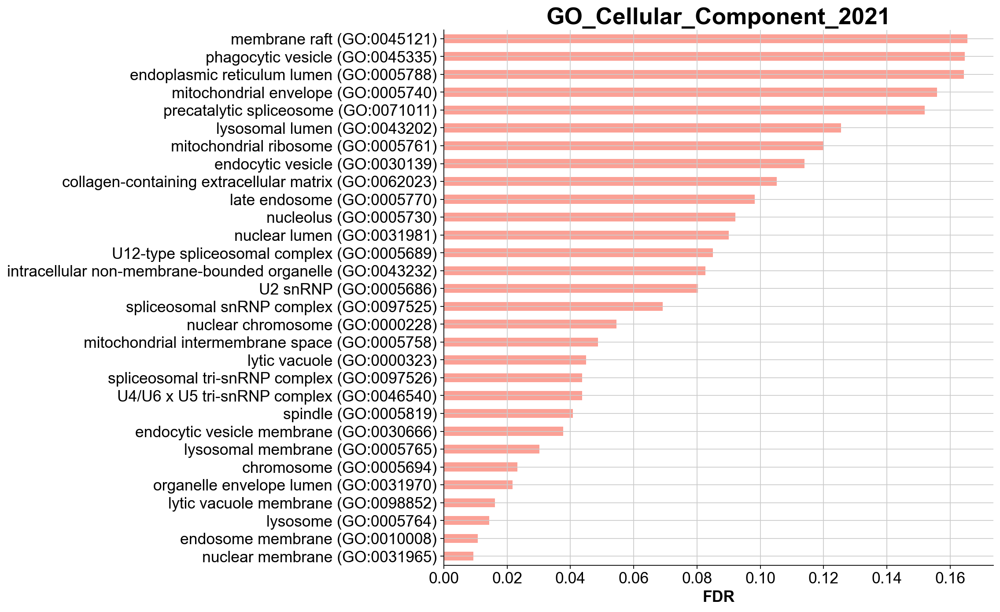

In [15]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10ra vs DN GSEA GO CC.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10))

In [16]:
gs_res_IL10ra_vs_DN = gp.gsea(data=expression_matrix_IL10ra_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='KEGG_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10ra_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10ra_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN_GSEA_KEGG_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10ra_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:36:00,554 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,NOD-like receptor signaling pathway,0.687665,2.313759,0.000000,0.000000,205,27,GABARAP;TXNIP;JUN;NFKBIA;CYBB;CTSB;GABARAPL1;C...,GABARAP;TXNIP;JUN;NFKBIA;CYBB;CTSB;GABARAPL1;C...
1,Ribosome biogenesis in eukaryotes,-0.572367,-1.959206,0.000000,0.027624,115,31,IMP3;RRP7A;NOB1;SBDS;EMG1;RPP25L;WDR43;NOP56;N...,POP5;AK6;CSNK2A1;GTPBP4;NXT1;GNL3;EIF6;DKC1;MP...
2,Human immunodeficiency virus 1 infection,0.463231,1.703193,0.000000,0.135895,238,54,B2M;H2-K1;H2-D1;APOBEC3;JUN;NFKBIA;H2-T22;RAC2...,B2M;H2-K1;H2-D1;APOBEC3;JUN;NFKBIA;H2-T22;RAC2...
3,Rheumatoid arthritis,0.561073,1.660233,0.000000,0.154376,84,18,LTB;JUN;ATP6V0B;ATP6V1G1;ATP6V1D;H2-AA;ATP6V1F...,LTB;JUN;ATP6V0B;ATP6V1G1;ATP6V1D;H2-AA;ATP6V1F...
4,B cell receptor signaling pathway,0.556760,1.559708,0.021739,0.160109,72,15,IFITM1;JUN;NFKBIA;RAC2;CD81;CD79B;PPP3CA;RAC1;...,IFITM1;JUN;NFKBIA;RAC2
5,Toxoplasmosis,0.508777,1.548201,0.021277,0.163979,108,20,NFKBIA;HSPA8;TNFRSF1A;MAPK14;H2-AA;H2-DMB1;H2-...,NFKBIA;HSPA8;TNFRSF1A;MAPK14;H2-AA;H2-DMB1
6,Osteoclast differentiation,0.477971,1.577204,0.000000,0.167905,128,21,JUN;NFKBIA;JUNB;TNFRSF1A;CYBA;MAPK14;SPI1;NCF4...,JUN;NFKBIA;JUNB;TNFRSF1A;CYBA;MAPK14;SPI1;NCF4...
7,Mitophagy,0.552742,1.566947,0.040816,0.169596,63,16,CITED2;GABARAP;JUN;GABARAPL1;UBB;GABARAPL2;TAX...,CITED2;GABARAP;JUN;GABARAPL1;UBB;GABARAPL2;TAX...
8,Natural killer cell mediated cytotoxicity,0.544946,1.708995,0.020408,0.177569,118,18,H2-K1;H2-D1;RAC2;CD48;PPP3CA;RAC1;ICAM2;IFNAR2...,H2-K1;H2-D1;RAC2
9,Endocytosis,0.422504,1.522444,0.023256,0.179799,269,54,H2-K1;H2-D1;H2-T22;SNF8;HSPA8;UBB;RAB11A;SNX5;...,H2-K1;H2-D1;H2-T22;SNF8;HSPA8;UBB;RAB11A;SNX5;...


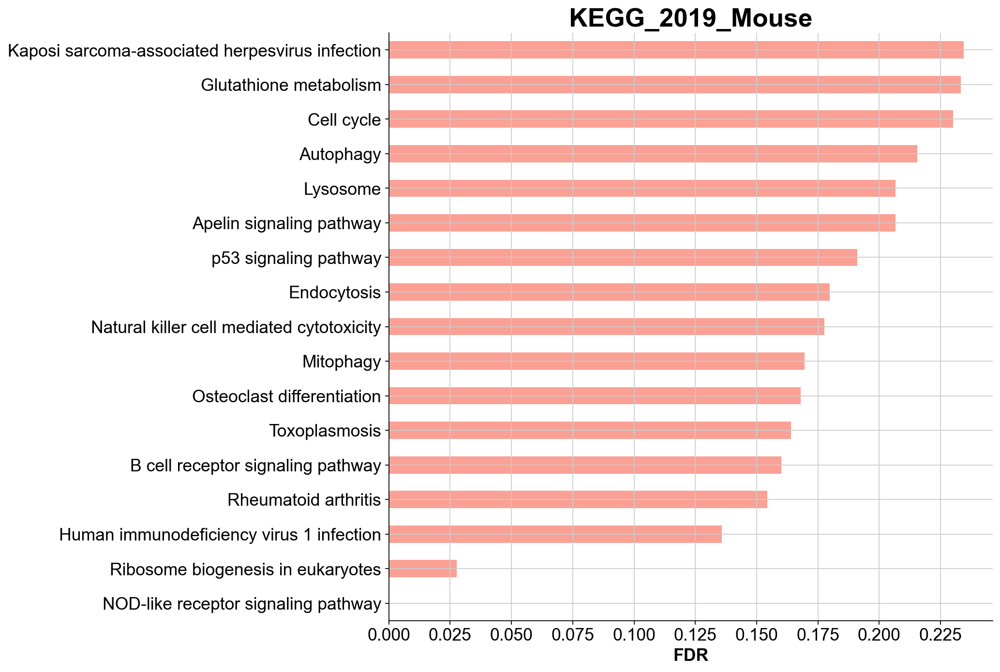

In [17]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10ra vs DN GSEA KEGG.png')

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10))

In [18]:
gs_res_IL10ra_vs_DN = gp.gsea(data=expression_matrix_IL10ra_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='WikiPathways_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10ra_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10ra_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN_GSEA_WIKI_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10ra_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:36:20,508 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,G1 to S cell cycle control WP413,-0.603901,-1.837190,0.0,0.018112,61,23,CCND3;CDKN2D;E2F4;RPA2;RPA1;PCNA;TFDP1;MCM3;PR...,CDKN2C;ORC6;CDK1;CCND2;CCNH;TRP53;MCM6;CDK4;MC...
1,PluriNetWork WP1763,-0.456793,-1.778926,0.0,0.027169,292,54,PIM1;MEF2C;SF1;CTNNB1;SUMO1;ATRX;RBBP4;HDAC1;Y...,NME2;PPP2R1A;SMARCA4;PARP1;HRAS;DDB1;SMARCA5;E...
2,p53 signaling WP2902,-0.610434,-1.676639,0.0,0.054337,67,15,SHISA5;CCND3;CASP3;CASP8;BID;BAX;CDK1;CCND2;CY...,BID;BAX;CDK1;CCND2;CYCS;CCNB1;TRP53;CCNB2;CDK4...


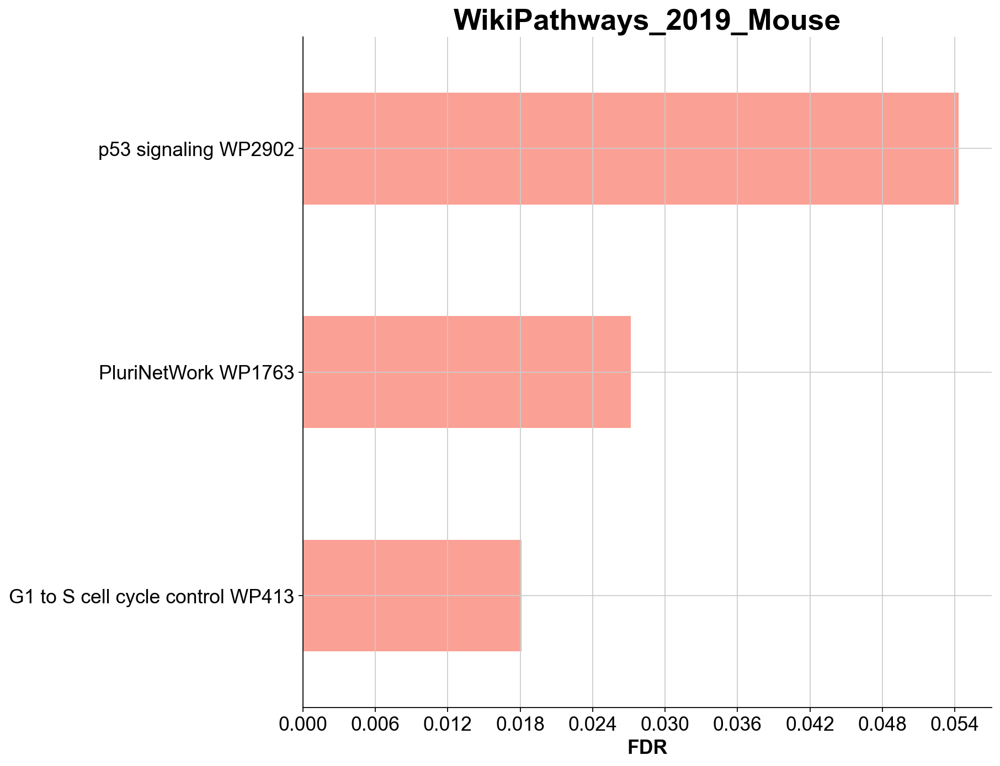

In [19]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10ra vs DN GSEA WIKI.png')

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10))

In [20]:
groups = ['IL10_Young_transplanted_separate', 'DN_Young_transplanted_separate']
IL10_vs_DN_GSEA = Young_transplanted_separate_Ambient_RNA_cleaned_HSC[Young_transplanted_separate_Ambient_RNA_cleaned_HSC.obs.IL10.isin(groups)]

In [21]:
expression_matrix_IL10_vs_DN = pd.DataFrame(IL10_vs_DN_GSEA.X)
expression_matrix_IL10_vs_DN.columns = IL10_vs_DN_GSEA.var.index
expression_matrix_IL10_vs_DN = expression_matrix_IL10_vs_DN.T
gene_list = list(IL10_vs_DN_GSEA.var.index)
column_values = pd.Series(gene_list)
expression_matrix_IL10_vs_DN.insert(loc=0, column='Description', value=column_values)
expression_matrix_IL10_vs_DN.insert(loc=0, column='NAME', value=gene_list)
expression_matrix_IL10_vs_DN['NAME'] = expression_matrix_IL10_vs_DN['NAME'].str.upper()
expression_matrix_IL10_vs_DN.index = range(len(expression_matrix_IL10_vs_DN.index))

In [22]:
phenotype_list_IL10_vs_DN = list(IL10_vs_DN_GSEA.obs.IL10)

In [23]:
gs_res_IL10_vs_DN = gp.gsea(data=expression_matrix_IL10_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Biological_Process_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png',)

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN_GSEA_GO_BP_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv', index=None)

significant_terms = gs_res_IL10_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:36:39,095 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,SRP-dependent cotranslational protein targetin...,-0.807328,-2.229850,0.000000,0.000000,90,84,SRP19;SRP9;SEC61A1;SRP14;SEC61B;RPL35;UBA52;SR...,RPL37A;RPL30;RPL28;RPL8;RPL39;RPL26;RPS8;RPLP2...
1,cellular macromolecule biosynthetic process (G...,-0.628058,-2.160746,0.000000,0.000000,314,167,MRPS21;POLD2;MRPL18;APOE;MRPL36;MRPS18B;RNPS1;...,POLR2K;MRPS14;RFC2;MCM5;ALAS1;RPS21;POLR2J;NAP...
2,cotranslational protein targeting to membrane ...,-0.799324,-2.214208,0.000000,0.000000,94,88,SRP19;SRP9;SEC61A1;SSR2;SEC62;SRP14;TRAM1;RPL3...,RPL28;RPL8;RPL39;RPL26;RPS8;RPLP2;RPL18;ARL6IP...
3,ncRNA processing (GO:0034470),-0.652569,-2.178781,0.000000,0.000000,201,108,MPHOSPH10;SBDS;NOB1;NOP56;DDX27;RPP21;EXOSC5;U...,WDR12;SRRT;RPF1;RPL37A;RPL30;RPL28;RPL8;RPL39;...
4,nuclear-transcribed mRNA catabolic process (GO...,-0.754701,-2.173312,0.000000,0.000000,171,105,RNPS1;GSPT1;CSDE1;EXOSC5;PPP2R1A;EIF4G1;PPP2CA...,RPL28;RPL8;RPL39;RPL26;RPS8;RPLP2;RPL18;RPL12;...
...,...,...,...,...,...,...,...,...,...
118,DNA repair (GO:0006281),-0.389980,-1.420019,0.028986,0.219343,298,66,BTG2;ALKBH1;POLD2;UNG;CDKN2D;UBC;UBB;BAZ1B;NAB...,USP1;GTF2H5;COMMD1;SMC1A;PPP5C;RAD21;NUCKS1;PN...
119,neutrophil activation involved in immune respo...,-0.315976,-1.410377,0.032258,0.228342,485,165,TXNDC5;CTSS;SLPI;DNAJC3;B2M;PRDX4;CD53;CTSB;CY...,ALDOA;PGLYRP1;ACTR10;PSMA5;STXBP2;RAC1;FABP5;C...
120,neutrophil degranulation (GO:0043312),-0.315976,-1.410377,0.032258,0.228342,481,165,TXNDC5;CTSS;SLPI;DNAJC3;B2M;PRDX4;CD53;CTSB;CY...,ALDOA;PGLYRP1;ACTR10;PSMA5;STXBP2;RAC1;FABP5;C...
121,regulation of canonical Wnt signaling pathway ...,-0.374005,-1.396475,0.022222,0.238759,253,63,PSMB8;DDX3X;APOE;WNK1;PFDN5;VCP;SLC9A3R1;UBE2B...,PSMA4;IGFBP4;PSMC4;HDAC1;PSMB4;PSMA3;PSMD6;RUV...


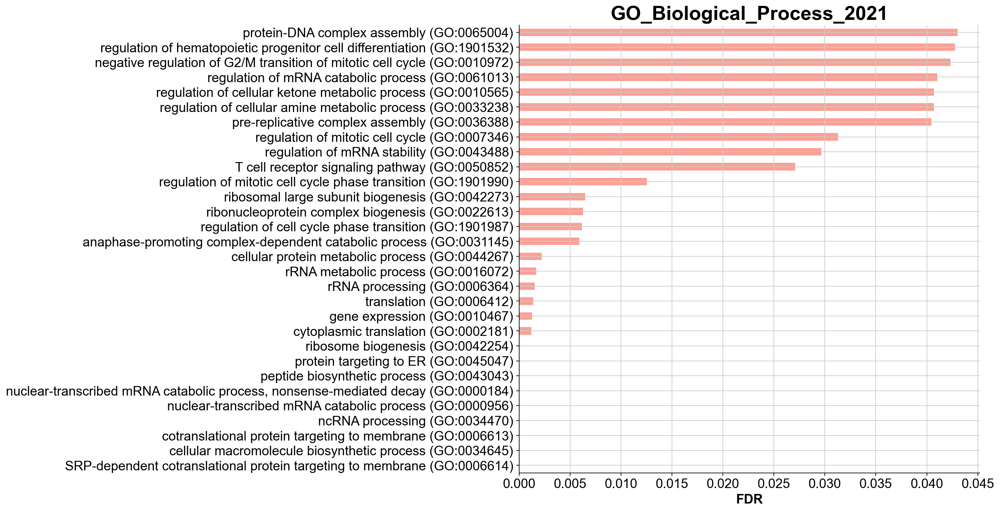

In [24]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs DN GSEA GO BP.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10))

In [25]:
gs_res_IL10_vs_DN = gp.gsea(data=expression_matrix_IL10_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Molecular_Function_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN_GSEA_GO_MF_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:37:14,916 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,active ion transmembrane transporter activity ...,-0.576105,-1.946739,0.000000,0.017862,42,15,CYB5A;UQCR11;COX6A1;NDUFA4;UQCRFS1;COX8A;UQCR1...,UQCRFS1;COX8A;UQCR10;UQCRC1;COX7A2L;UQCRQ;COX5...
1,proton transmembrane transporter activity (GO:...,-0.545955,-1.806340,0.000000,0.053585,40,16,CYB5A;UQCR11;COX6A1;NDUFA4;ATP6V1F;UQCRFS1;COX...,UQCRFS1;COX8A;UQCR10;UQCRC1;COX7A2L;UQCRQ;COX5...
2,kinase binding (GO:0019900),-0.446436,-1.773483,0.000000,0.053585,461,79,DNAJC3;IFNAR2;RHOA;RHOB;RGCC;CDKN2D;CDK5RAP3;T...,PGAM1;VDAC1;PIK3IP1;TUBA4A;PEBP1;NPM1;CKS2;VRK...
3,rRNA binding (GO:0019843),-0.594439,-1.723974,0.000000,0.062516,42,26,SBDS;MRPL16;MRPL18;CIRBP;GTF3A;MRPL11;PPAN;MRP...,RPF2;RPL12;RPL23;RPL11;RPS9;RPLP0;RPS14;RPL5;R...
4,protein kinase binding (GO:0019901),-0.420291,-1.646695,0.000000,0.117888,506,85,DNAJC3;IFNAR2;RHOA;RHOB;RGCC;CDKN2D;TCF3;CDK5R...,CALM2;HINT1;ACTB;PPP1CC;RBBP6;PRKAR2B;CKS1B;PG...
5,ubiquitin protein ligase binding (GO:0031625),-0.370715,-1.453933,0.023810,0.205410,265,72,BCL2;JUN;AUP1;HSPA5;DERL1;HSPBP1;NFKBIA;RTN4;G...,YWHAE;UBXN1;PA2G4;TCP1;PSMA3;PCBP2;PSMD1;GABAR...
6,GTPase binding (GO:0051020),-0.439492,-1.510257,0.000000,0.207846,201,29,RABGAP1L;IFT20;PDE6D;AIMP1;RAB8A;RALBP1;AKAP13...,LAMTOR1;GNB1;STOML2;ENO1;ARHGDIB;GNB2;RANBP1;H...
7,tubulin binding (GO:0015631),-0.434801,-1.459884,0.045455,0.211960,307,40,SBDS;DDX3X;GABARAP;RAB11A;PAFAH1B1;B9D2;EZR;MA...,RCC2;ALDOA;CCT5;DRG1;S100A8;S100A9;TPR;GABARAP...
8,ubiquitin-like protein ligase binding (GO:0044...,-0.380693,-1.535667,0.022222,0.214341,282,77,BCL2;JUN;AUP1;HSPA5;DERL1;HSPBP1;DDRGK1;NFKBIA...,YWHAE;UBXN1;PA2G4;TCP1;PSMA3;PCBP2;PSMD1;GABAR...
9,mRNA binding (GO:0003729),-0.351072,-1.479354,0.038462,0.218463,263,99,SLPI;HDLBP;SYNCRIP;PUM2;DDX3X;LSM14A;CELF2;PUM...,SF1;MRPL13;PCBP1;YBX3;HNRNPM;EIF4G2;SRRM2;SSB;...


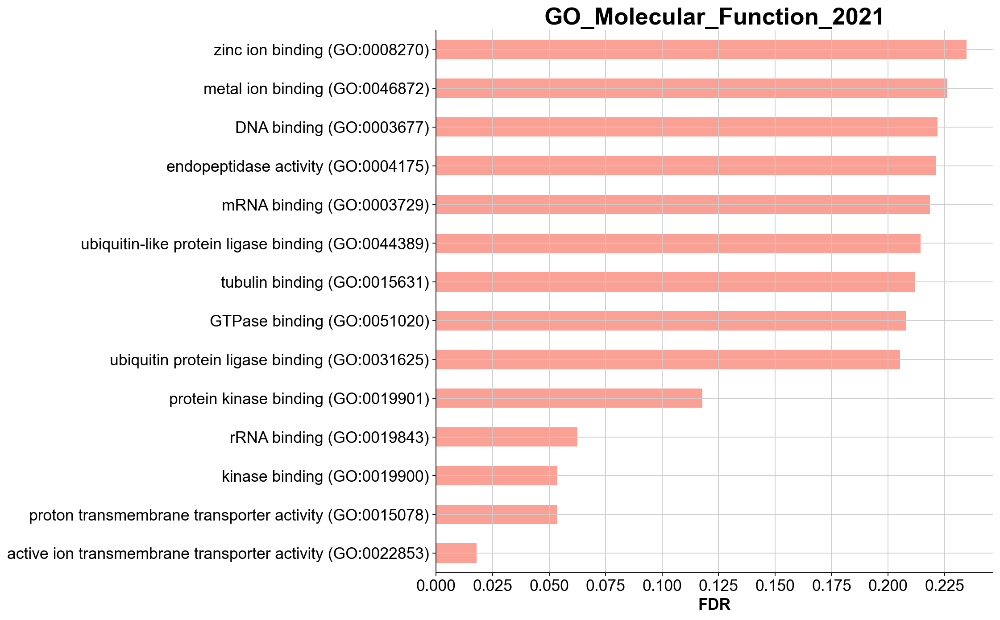

In [26]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs DN GSEA GO MF.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10))

In [27]:
gs_res_IL10_vs_DN = gp.gsea(data=expression_matrix_IL10_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Cellular_Component_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN_GSEA_GO_CC_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:37:36,508 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,cell-substrate junction (GO:0030055),-0.552862,-2.151011,0.000000,0.000000,394,123,REXO2;B2M;HSP90B1;PPIB;HSPA5;FES;MAPK1;LAMTOR3...,ACTG1;RPL37A;RPL30;HNRNPK;NPM1;RPL8;ATP6V0C;RP...
1,cytosolic large ribosomal subunit (GO:0022625),-0.823826,-2.086984,0.000000,0.000000,55,49,RPL36AL;RPL7L1;RPL35;RPL38;RPL41;RSL24D1;RPL34...,RPL37A;RPL30;RPL28;RPL8;RPL39;RPL26;RPLP2;RPL1...
2,focal adhesion (GO:0005925),-0.556002,-2.188880,0.000000,0.000000,387,122,REXO2;B2M;HSP90B1;PPIB;HSPA5;FES;MAPK1;LAMTOR3...,ACTG1;RPL37A;RPL30;HNRNPK;NPM1;RPL8;ATP6V0C;RP...
3,large ribosomal subunit (GO:0015934),-0.803506,-2.143920,0.000000,0.000000,59,52,RPL36AL;RPL7L1;MRPL11;RPL35;MRPL22;RPL38;RPL41...,RPL37A;RPL30;RPL28;RPL8;RPL39;RPL26;RPLP2;RPL1...
4,nuclear lumen (GO:0031981),-0.429638,-1.916906,0.000000,0.003541,745,226,REXO2;PIM1;JUN;MPHOSPH10;SRP19;CAPG;SBDS;DDRGK...,PA2G4;WDR74;TOP1;MOB2;NCL;FBL;RSL24D1;CSTB;LAR...
5,small ribosomal subunit (GO:0015935),-0.749308,-1.923461,0.000000,0.003984,45,38,UBA52;EIF2A;MRPS11;RPS27L;MRPS16;MRPS9;RPS27;R...,RACK1;RPS8;RPS17;RPS6;RPS15;RPS15A;RPS11;RPS24...
6,cytosolic small ribosomal subunit (GO:0022627),-0.795020,-1.964262,0.000000,0.004553,40,34,UBA52;EIF2A;MRPS11;RPS27L;RPS27;RPS29;RPS21;RP...,RPS8;RPS17;RPS6;RPS15;RPS15A;RPS11;RPS24;RPS16...
7,intracellular non-membrane-bounded organelle (...,-0.421384,-1.976543,0.000000,0.005311,1158,315,REXO2;SERP1;PIM1;AUP1;MPHOSPH10;SRP19;CAPG;MAP...,PA2G4;WDR74;STOML2;TOP1;MOB2;NCL;FBL;RSL24D1;C...
8,U12-type spliceosomal complex (GO:0005689),-0.600469,-1.894561,0.000000,0.006374,28,21,ZMAT5;SNRNP48;SNRNP25;SF3B1;LSM7;SF3B3;SF3B6;S...,SNRPD2;PHF5A;DHX15;SF3B4;SNRPG;SNRPF;ZCRB1;SF3...
9,ribosome (GO:0005840),-0.719088,-2.017905,0.000000,0.006374,62,52,SERP1;MRPS12;HSPA14;RRBP1;SF1;MRPL13;RPL38;RPL...,RPS21;RPL24;RPS28;RPS26;APEX1;RPL30;RPL8;RPL39...


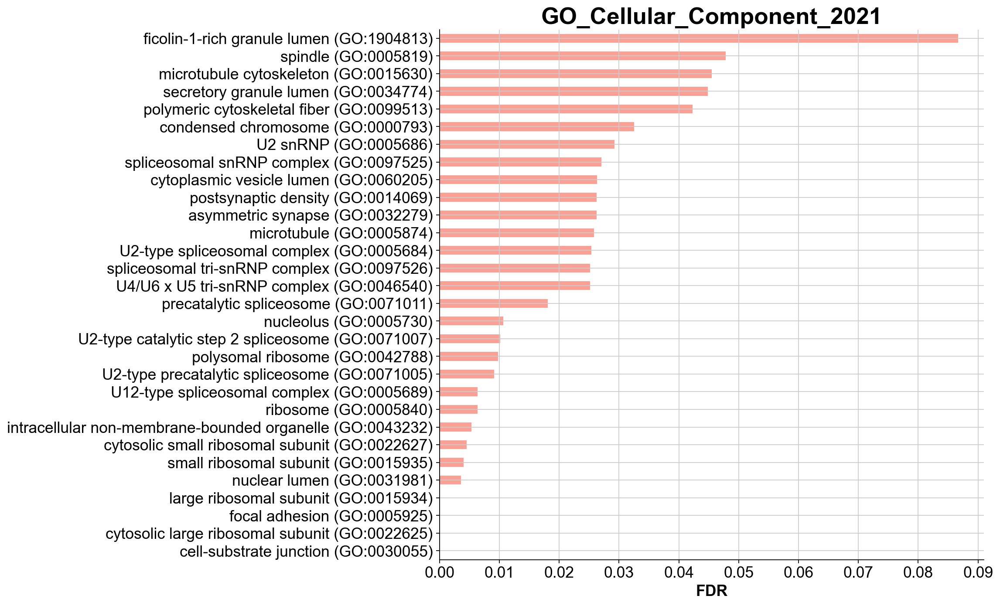

In [28]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs DN GSEA GO CC.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10))

In [29]:
gs_res_IL10_vs_DN = gp.gsea(data=expression_matrix_IL10_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='KEGG_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN_GSEA_KEGG_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:37:58,189 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,Ribosome,-0.690550,-2.164533,0.000000,0.000000,170,122,MRPS21;MRPL16;MRPL18;MRPL36;RPL36AL;MRPL14;MRP...,RPL28;RPL8;RPL39;RPL26;RPS8;RPLP2;RPL18;RPL12;...
1,Systemic lupus erythematosus,-0.603375,-1.870477,0.025641,0.078019,143,20,H2-EB1;H2-AB1;H2-AA;H2-DMA;HIST1H2BC;H2-DMB1;H...,SNRPD1;SNRPD3;ELANE;H2AFZ;CTSG;H2AFY;H2AFJ;SNR...
2,Progesterone-mediated oocyte maturation,-0.619819,-1.740349,0.015625,0.218453,90,18,MAPK1;ANAPC13;CDC26;MAPK14;GNAI3;GNAI2;RPS6KA1...,ANAPC11;MAD2L1;HSP90AA1;KIF22;CCNB2;AURKA;HSP9...
3,Necroptosis,-0.488177,-1.691771,0.000000,0.230156,176,33,BCL2;IFNAR2;FTL1;CYBB;GLUL;CHMP2A;RBCK1;BAX;BI...,VDAC2;IFNGR1;SLC25A4;VDAC1;GLUD1;PPID;SLC25A5;...


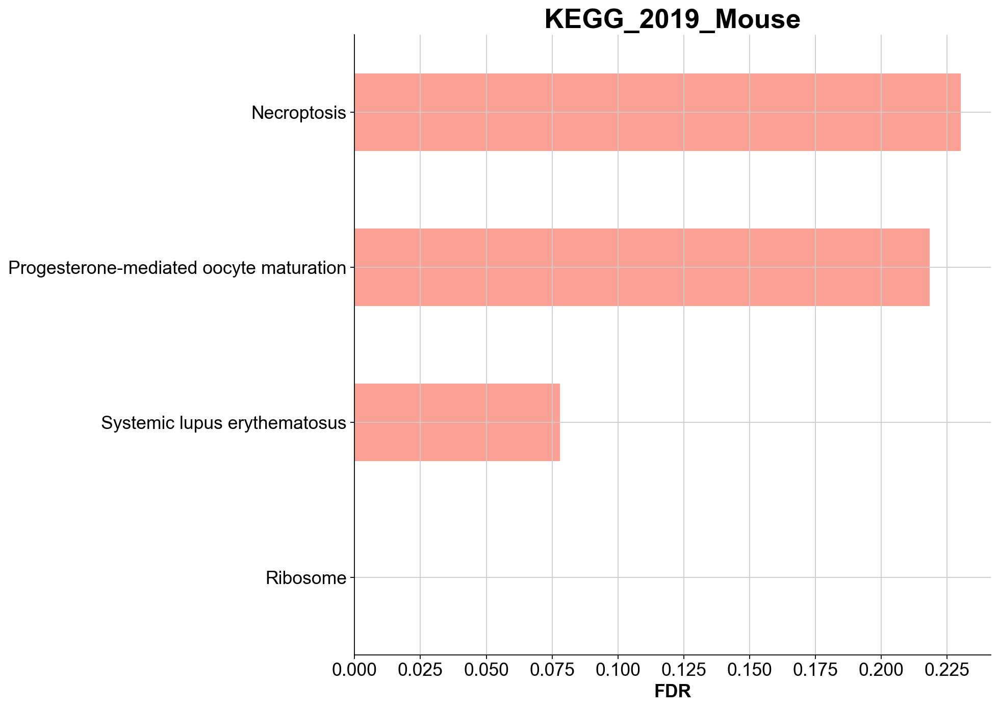

In [30]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs DN GSEA KEGG.png')

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10))

In [31]:
gs_res_IL10_vs_DN = gp.gsea(data=expression_matrix_IL10_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='WikiPathways_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN_GSEA_WIKI_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:38:18,012 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,Cytoplasmic Ribosomal Proteins WP163,-0.823001,-2.094611,0.000000,0.000000,92,75,RPL35;RPL38;RPL41;RPS27;RPS29;RPS6KA1;RPL34;RP...,RPL37A;RPL30;RPL28;RPL8;RPL39;RPL26;RPS8;RPLP2...
1,mRNA processing WP310,-0.371233,-1.596586,0.023256,0.173644,457,208,SRP19;SYNCRIP;SRP9;TMED10;RNASET2B;PUM2;DDX3X;...,EIF4A3;NELFE;LTV1;IMP4;SF3B2;SMN1;PCBP1;SF3A3;...
2,Glycolysis and Gluconeogenesis WP157,-0.472449,-1.527509,0.042553,0.216090,51,20,PFKL;DLD;MDH1;PDHA1;PDHB;PKM;MPC2;MPC1;TPI1;LD...,TPI1;LDHA;PGK1;ALDOA;GOT2;HK1;MDH2;GAPDH;ENO1;...
3,Proteasome Degradation WP519,-0.439197,-1.602115,0.022222,0.221235,52,44,PSMB8;RPN2;UBB;UBE2B;PSMB10;PSMD7;RPN1;PSMD11;...,PSMC4;PSMB4;PSMA3;PSMD6;PSME2;PSMD3;PSMA2;PSMB...


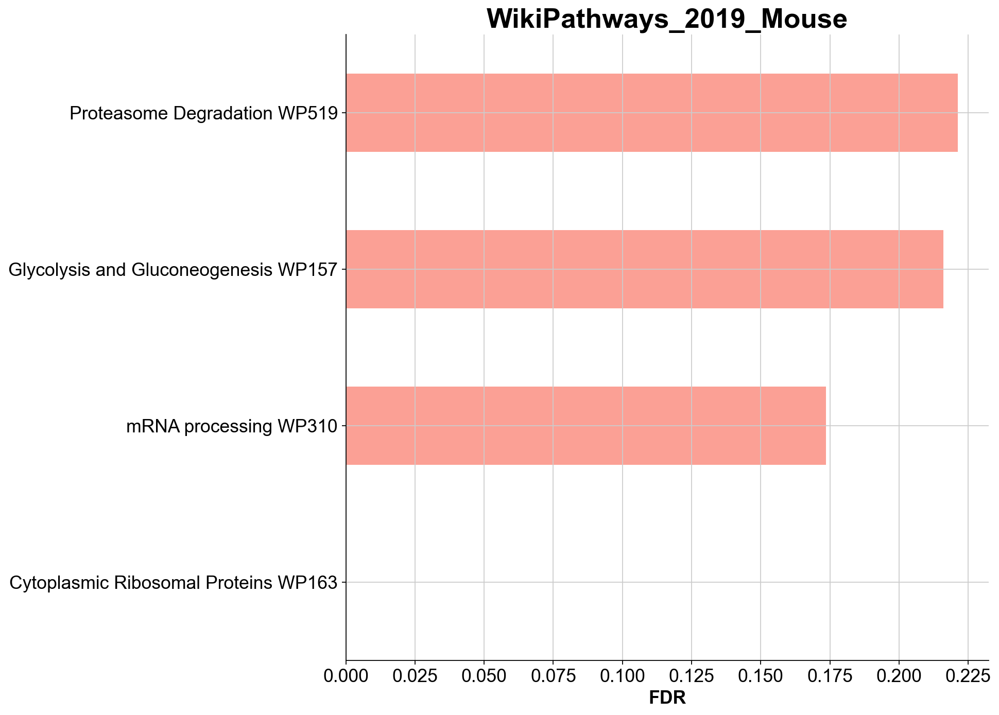

In [32]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs DN GSEA WIKI.png')

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10))

In [33]:
groups = ['IL10_Young_transplanted_separate', 'IL10ra_Young_transplanted_separate']
IL10_vs_IL10ra_GSEA = Young_transplanted_separate_Ambient_RNA_cleaned_HSC[Young_transplanted_separate_Ambient_RNA_cleaned_HSC.obs.IL10.isin(groups)]

In [34]:
expression_matrix_IL10_vs_IL10ra = pd.DataFrame(IL10_vs_IL10ra_GSEA.X)
expression_matrix_IL10_vs_IL10ra.columns = IL10_vs_IL10ra_GSEA.var.index
expression_matrix_IL10_vs_IL10ra = expression_matrix_IL10_vs_IL10ra.T
gene_list = list(IL10_vs_IL10ra_GSEA.var.index)
column_values = pd.Series(gene_list)
expression_matrix_IL10_vs_IL10ra.insert(loc=0, column='Description', value=column_values)
expression_matrix_IL10_vs_IL10ra.insert(loc=0, column='NAME', value=gene_list)
expression_matrix_IL10_vs_IL10ra['NAME'] = expression_matrix_IL10_vs_IL10ra['NAME'].str.upper()
expression_matrix_IL10_vs_IL10ra.index = range(len(expression_matrix_IL10_vs_IL10ra.index))

In [35]:
phenotype_list_IL10_vs_IL10ra = list(IL10_vs_IL10ra_GSEA.obs.IL10)

In [36]:
gs_res_IL10_vs_IL10ra = gp.gsea(data=expression_matrix_IL10_vs_IL10ra, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Biological_Process_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_IL10ra, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png',)

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_IL10ra.res2d.to_csv('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra_GSEA_GO_BP_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv', index=None)

significant_terms = gs_res_IL10_vs_IL10ra.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:38:41,034 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,SRP-dependent cotranslational protein targetin...,-0.829066,-2.107944,0.000000,0.000000,90,84,SRP19;SRP9;SEC61A1;SEC61B;SRP14;RPL35;SRP72;RP...,RPS8;RPS21;RPL8;RPLP2;RPL28;RPS26;RPS25;RPS11;...
1,cellular macromolecule biosynthetic process (G...,-0.627075,-2.115475,0.000000,0.000000,314,167,MRPS21;POLD2;MRPL36;MRPL18;MRPS18B;GSPT1;RNASE...,MRPS17;POLR2J;PTMA;MRPS18A;SET;NAP1L1;MRPL42;R...
2,cellular protein metabolic process (GO:0044267),-0.620792,-2.230794,0.000000,0.000000,417,166,SEC11C;SERP1;DNAJC3;HSP90B1;SPCS1;SPCS2;SPCS3;...,UBE2M;RPS8;CTSG;RPS21;RPL8;RPLP2;RPL28;RPS26;M...
3,cotranslational protein targeting to membrane ...,-0.815386,-2.129614,0.000000,0.000000,94,88,SSR2;SRP19;SRP9;SEC61A1;SRP14;RPL35;SEC62;TRAM...,RPS8;RPS21;RPL8;RPLP2;RPL28;RPS26;RPS25;RPS11;...
4,ncRNA processing (GO:0034470),-0.682488,-2.134013,0.000000,0.000000,201,108,MPHOSPH10;SBDS;DDX27;NOB1;NOP56;XRN2;EXOSC1;DD...,WDR12;RPL34;RPLP1;RPL24;RPS28;RPS27;NOP53;RPF1...
...,...,...,...,...,...,...,...,...,...
105,plasma membrane bounded cell projection organi...,-0.487226,-1.444075,0.041667,0.221407,128,17,MANF;ATXN10;BTG2;VAPA;SLC9A3R1;RAB11A;ROCK1;AP...,NEDD4;RAC1;TOR1A;DTNBP1;PRMT1;BLOC1S2;HMGB1;ST...
106,antigen receptor-mediated signaling pathway (G...,-0.377591,-1.432343,0.033898,0.227842,185,52,CD79B;LAT2;BCL2;PSMB8;MEF2C;RBCK1;WNK1;PSMD7;C...,PSMD4;PSMB9;EIF2B1;PDE4D;PSMA7;PSMD9;PSMA6;PSM...
107,positive regulation of cellular process (GO:00...,-0.354197,-1.428598,0.037037,0.229287,625,98,BCL2;COX17;XBP1;CYBA;DDX3X;SOX4;PHIP;CSNK2A1;D...,CDC42;LYAR;GATA2;CTSH;TGFB1;S100A13;HRAS;LBP;P...
108,cellular response to DNA damage stimulus (GO:0...,-0.403648,-1.428680,0.016129,0.230872,350,67,BCL2;CRIP1;BTG2;ALKBH1;UNG;BAZ1B;VCP;BAX;OARD1...,PNKP;FAM111A;DCUN1D5;MAPK14;TAOK3;MYC;CIB1;RFC...


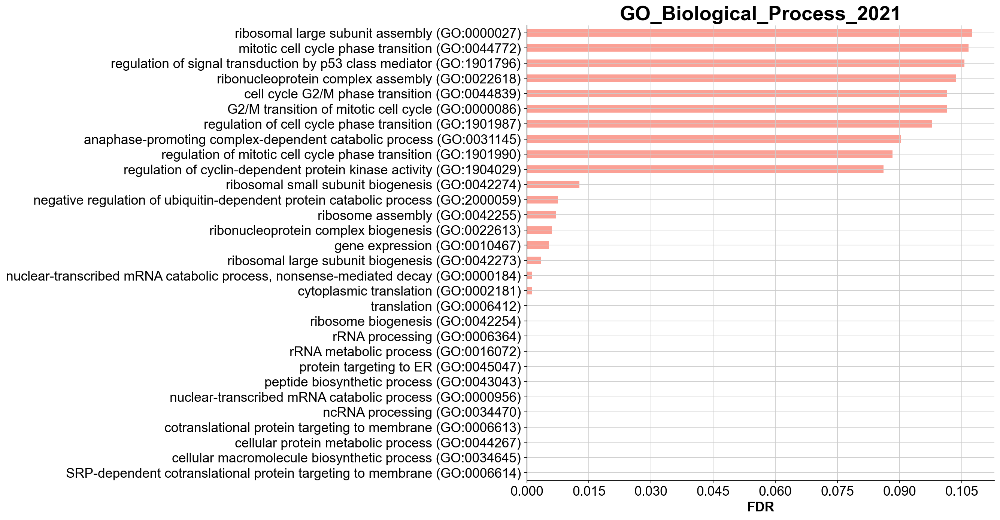

In [37]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs IL10ra GSEA GO BP.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10))

In [38]:
gs_res_IL10_vs_IL10ra = gp.gsea(data=expression_matrix_IL10_vs_IL10ra, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Molecular_Function_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_IL10ra, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_IL10ra.res2d.to_csv('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra_GSEA_GO_MF_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_IL10ra.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:38:53,047 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,rRNA binding (GO:0019843),-0.639615,-1.865765,0.000000,0.054316,42,26,SBDS;MRPL18;MRPL16;GTF3A;MRPL11;PPAN;CIRBP;DDX...,RPL12;RPL23;RPS9;RPLP0;RPL11;RPS14;RPL5;RPS5;R...
1,protein kinase binding (GO:0019901),-0.427779,-1.742058,0.000000,0.078457,506,85,DNAJC3;IFNAR2;RGCC;INKA1;RHOB;RHOA;TCF3;JTB;PR...,RAC2;IQGAP1;PGAM1;HINT1;TWF2;TUBA4A;TPR;CALM1;...
2,tubulin binding (GO:0015631),-0.472250,-1.766516,0.018519,0.090527,307,40,SBDS;DDX3X;B9D2;EZR;SMC3;VAPA;PAFAH1B1;RAB11A;...,GAPDH;KIF5B;CCT5;KRIT1;S100A8;S100A9;TPR;ALDOA...
3,DNA binding (GO:0003677),-0.347607,-1.447083,0.015873,0.168122,811,127,SLPI;BCL2;XBP1;UNG;DDX3X;HMGB3;ARID1A;JUN;IMPD...,LYAR;MTF2;TSN;PNKP;FAM111A;SLTM;PCNA;DNMT1;CEB...
4,translation initiation factor activity (GO:000...,-0.404219,-1.432705,0.019608,0.170034,41,27,EIF3A;EIF2S2;EIF3G;EIF2A;EIF4G1;EIF4G2;EIF3B;E...,EIF3I;EIF3D;COPS5;EIF3L;EIF1B;EIF3C;EIF4A2;EIF...
5,guanyl-nucleotide exchange factor activity (GO...,-0.559745,-1.627431,0.018868,0.181055,149,16,LAMTOR3;LAMTOR2;CCZ1;RAP1A;PREB;LAMTOR5;AKAP13...,LAMTOR1;EEF1D;LAMTOR4;RASGRP2;EIF2B1;RANGRF;RC...
6,guanyl ribonucleotide binding (GO:0032561),-0.403443,-1.451905,0.020408,0.184867,214,37,RHOB;RHOA;RAP1B;ARF4;RAB14;GNL3;RAP1A;ARF6;ARL...,CDC42;RAB38;HRAS;RAB11B;ARF1;RAC1;RAC2;TUBA4A;...
7,active ion transmembrane transporter activity ...,-0.501268,-1.466404,0.044444,0.188510,42,15,UQCR11;COX6A1;CYB5A;NDUFA4;COX8A;UQCR10;UQCRFS...,UQCR10;UQCRFS1;UQCRQ;UQCRC1;COX5B;COX5A;COX7A2...
8,proton transmembrane transporter activity (GO:...,-0.501860,-1.492398,0.021739,0.188814,40,16,UQCR11;COX6A1;CYB5A;NDUFA4;COX8A;ATP6V1F;UQCR1...,ATP6V1F;UQCR10;UQCRFS1;UQCRQ;UQCRC1;COX5B;COX5...
9,ubiquitin protein ligase binding (GO:0031625),-0.396958,-1.499914,0.027778,0.190804,265,72,HSPBP1;BCL2;AUP1;HSPA5;DERL1;JUN;RTN4;LAPTM5;V...,UBE2J2;PSMA3;TCP1;UBXN1;PCBP2;SUMO1;CCT2;UQCRC...


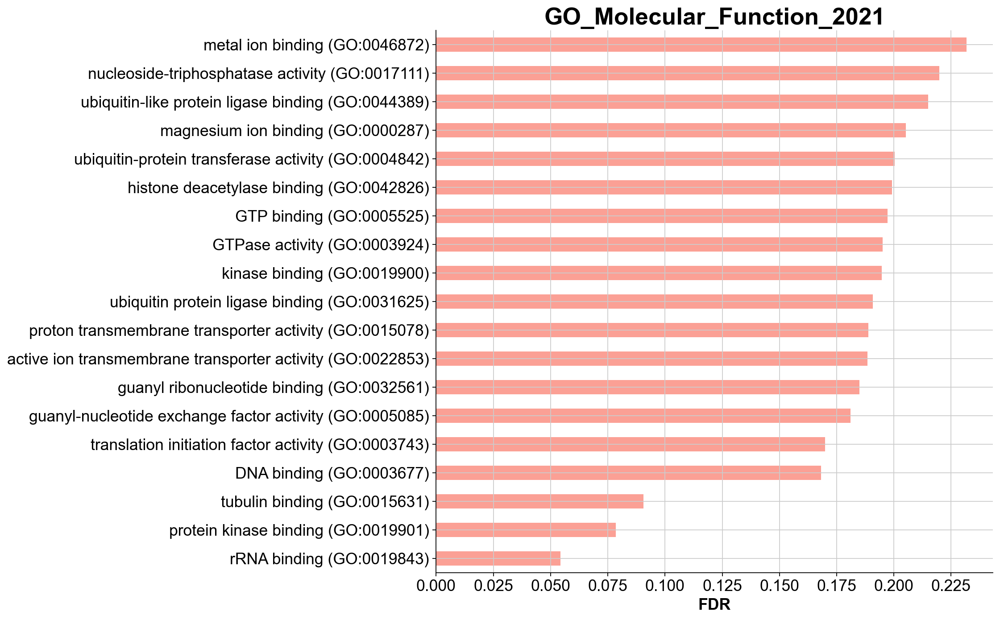

In [39]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs IL10ra GSEA GO MF.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10))

In [40]:
gs_res_IL10_vs_IL10ra = gp.gsea(data=expression_matrix_IL10_vs_IL10ra, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Cellular_Component_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_IL10ra, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10_vs_IL10ra.res2d.to_csv('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra_GSEA_GO_CC_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_IL10ra.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:38:57,281 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,cell-substrate junction (GO:0030055),-0.566614,-2.079354,0.000000,0.000000,394,123,REXO2;HSP90B1;HSPA5;B2M;MAPK1;PPIB;FES;RHOB;CD...,RPS8;RPL8;ANXA1;RPLP2;GNB2;ATP6V0C;RPS11;RPS17...
1,cytosolic small ribosomal subunit (GO:0022627),-0.832648,-2.115260,0.000000,0.000000,40,34,EIF2A;RPS27L;MRPS11;UBA52;RPS29;RPS28;RPS27;RP...,RPS28;RPS27;RPS8;RPS21;RPS26;RPS25;RPS11;RPS6;...
2,focal adhesion (GO:0005925),-0.570022,-2.106055,0.000000,0.000000,387,122,REXO2;HSP90B1;HSPA5;B2M;MAPK1;PPIB;FES;RHOB;CD...,RPS8;RPL8;ANXA1;RPLP2;GNB2;ATP6V0C;RPS11;RPS17...
3,large ribosomal subunit (GO:0015934),-0.823535,-2.115016,0.000000,0.000000,59,52,RPL36AL;MRPL11;RPL7L1;RPL35;MRPL22;RPL41;RSL24...,RPL8;RPLP2;RPL28;RPL12;RPL37A;RPL26;RPL30;RPL3...
4,ribosome (GO:0005840),-0.750185,-2.147790,0.000000,0.000000,62,52,SERP1;MRPS12;MRPL13;HSPA14;RRBP1;RPL41;SF1;RPL...,RPL24;RPS28;RPS27;RPS21;RPL8;RPS26;RPS25;RPS11...
5,small ribosomal subunit (GO:0015935),-0.794902,-2.230734,0.000000,0.000000,45,38,EIF2A;RPS27L;MRPS11;UBA52;MRPS16;MRPS9;RPS29;M...,RPS28;RPS27;RPS8;RPS21;RPS26;RPS25;RPS11;RACK1...
6,cytosolic large ribosomal subunit (GO:0022625),-0.842214,-2.058724,0.000000,0.002296,55,49,RPL36AL;RPL7L1;RPL35;RPL41;RSL24D1;RPL38;RPL34...,RPL8;RPLP2;RPL28;RPL12;RPL37A;RPL26;RPL30;RPL3...
7,polysomal ribosome (GO:0042788),-0.787295,-1.896545,0.000000,0.016069,30,25,RPL41;RPL38;LARP4B;RPS29;RPL24;RPS28;RPS21;RPL...,RPL24;RPS28;RPS21;RPL8;RPS26;RPL30;RPL36A;RPL7...
8,asymmetric synapse (GO:0032279),-0.689946,-1.808809,0.000000,0.033744,133,20,FABP5;SIGMAR1;DBNL;RPL38;CRIPT;RHEB;DTNBP1;RPS...,RPS27;RPL8;RPS25;RPL12;RPL30;RPS18;RPS19;RPL14...
9,postsynaptic density (GO:0014069),-0.689946,-1.808809,0.000000,0.033744,138,20,FABP5;SIGMAR1;DBNL;RPL38;CRIPT;RHEB;DTNBP1;RPS...,RPS27;RPL8;RPS25;RPL12;RPL30;RPS18;RPS19;RPL14...


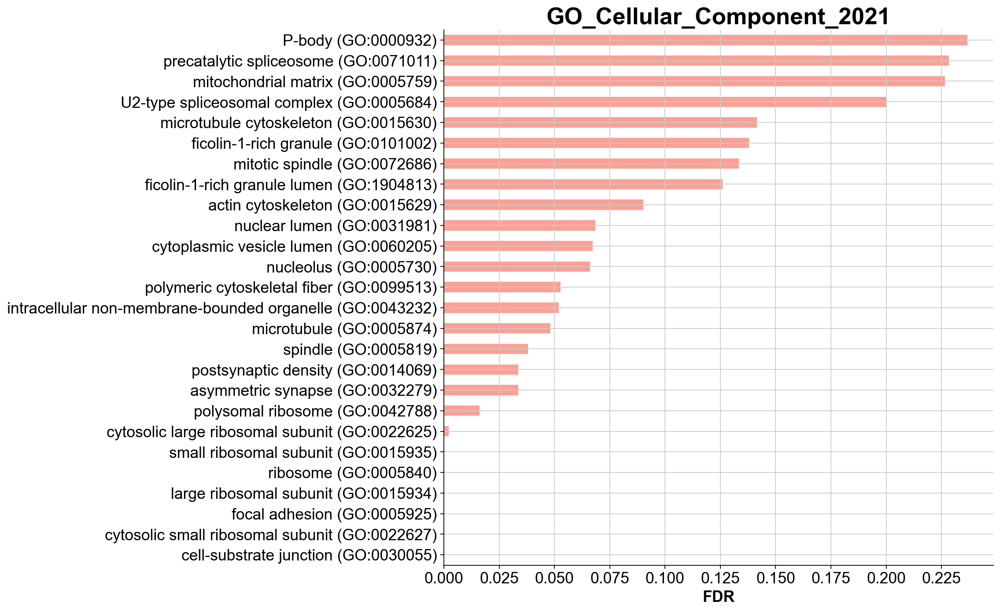

In [41]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs IL10ra GSEA GO CC.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10))

In [42]:
gs_res_IL10_vs_IL10ra = gp.gsea(data=expression_matrix_IL10_vs_IL10ra, # or data='./P53_resampling_data.txt'
                 gene_sets='KEGG_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10_vs_IL10ra, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10_vs_IL10ra.res2d.to_csv('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra_GSEA_KEGG_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_IL10ra.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:39:01,595 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,Ribosome,-0.734981,-2.243436,0.0,0.0,170,122,MRPS21;MRPL36;MRPL18;MRPL16;MRPL14;RPL36AL;MRP...,RPS8;MRPL12;RPS21;RPL8;RPLP2;RPL28;RPS26;MRPL2...


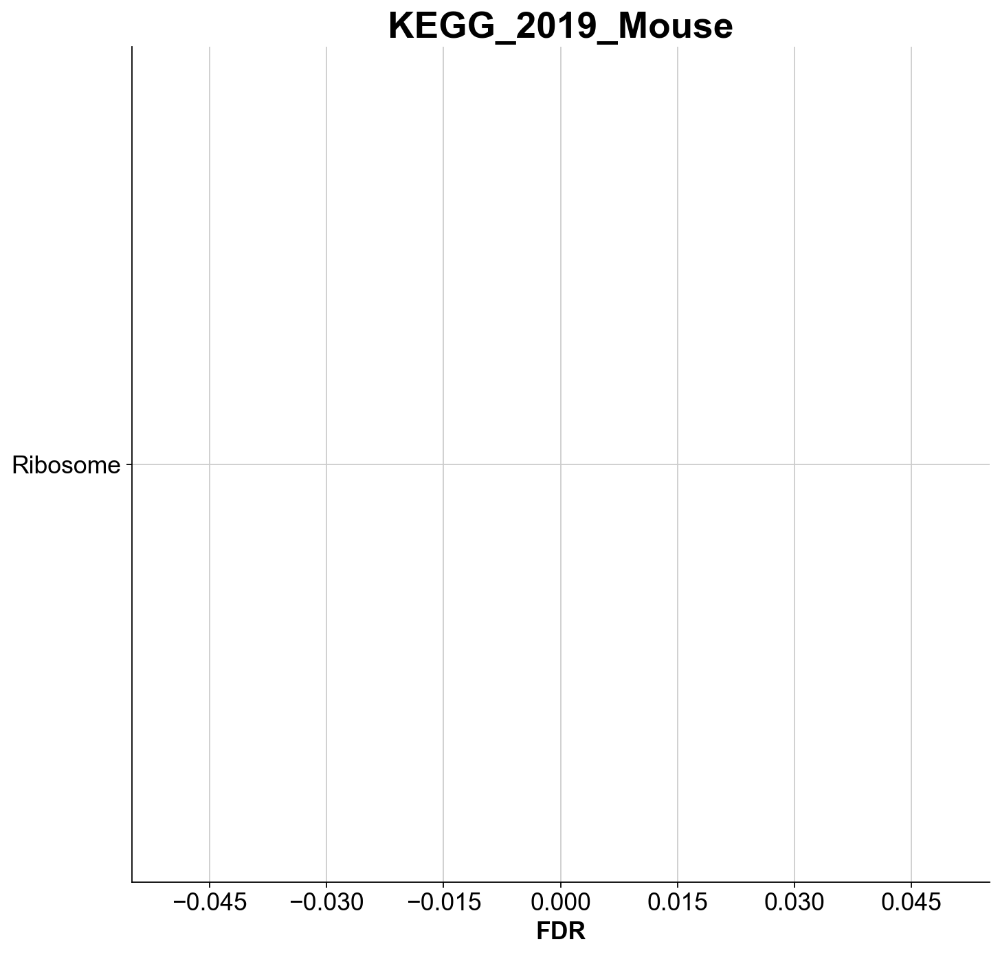

In [43]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs IL10ra GSEA KEGG.png')

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10))

In [44]:
gs_res_IL10_vs_IL10ra = gp.gsea(data=expression_matrix_IL10_vs_IL10ra, # or data='./P53_resampling_data.txt'
                 gene_sets='WikiPathways_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10_vs_IL10ra, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_IL10ra.res2d.to_csv('/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra_GSEA_WIKI_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_IL10ra.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:39:04,546 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,Cytoplasmic Ribosomal Proteins WP163,-0.844889,-2.099992,0.0,0.000000,92,75,RPL35;RPL41;RPL38;RPS29;RPS6KA1;RPL34;RPLP1;RP...,RPS8;RPS21;RPL8;RPLP2;RPL28;RPS26;RPS25;RPS11;...
1,Translation Factors WP307,-0.504733,-1.927306,0.0,0.008519,50,35,EIF4B;EIF2S3X;EIF4EBP1;EIF3A;EIF2S2;EIF3G;EIF4...,ETF1;EIF3C;EIF3J1;EEF1D;EIF5A;EIF4A2;EEF1G;EIF...
2,TNF-alpha NF-kB Signaling Pathway WP246,-0.465522,-1.702007,0.0,0.130620,187,63,CDC34;DDX3X;SMARCC1;UBE2I;CSNK2A1;SMARCA4;SMAR...,FBL;MCM7;PSMD3;SUMO1;POLR2H;MCM5;HDAC1;SMARCE1...


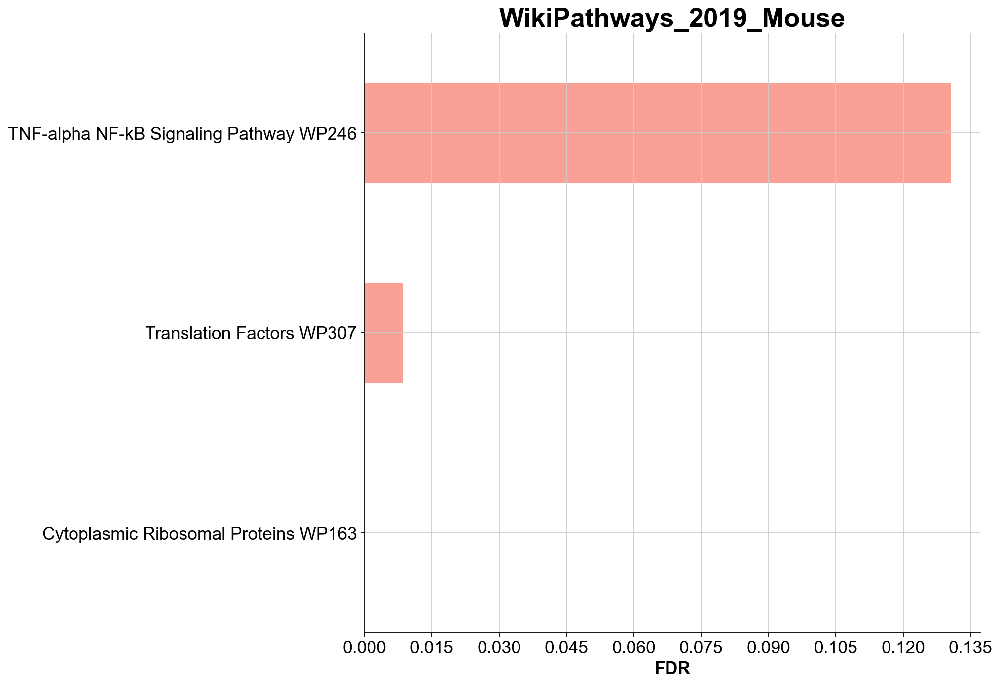

In [45]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs IL10ra GSEA WIKI.png')

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10))

In [46]:
sc.tl.rank_genes_groups(Young_transplanted_separate_Ambient_RNA_cleaned_HSC, 'IL10', groups = ['IL10ra_Young_transplanted_separate'], reference = 'DN_Young_transplanted_separate', method='wilcoxon', corr_method='bonferroni', key_added = 'wilcoxon_bonferroni_Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN', use_raw=False)
result = Young_transplanted_separate_Ambient_RNA_cleaned_HSC.uns['wilcoxon_bonferroni_Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals', 'pvals_adj']}).head(10)

Trying to set attribute `._uns` of view, copying.


,IL10ra_Young_transplanted_separate_n,IL10ra_Young_transplanted_separate_p
0,Ifitm1,5.307633e-08
1,Glul,8.143825e-06
2,Apoe,1.648868e-04
3,Plac8,5.898797e-03
4,Ifitm3,1.428547e-02
5,Gimap6,1.768832e-02
6,Lgals3,2.822439e-02
7,B2m,4.465914e-02
8,Cited2,9.020171e-02
9,Cpa3,1.275791e-01


In [47]:
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC = sc.get.rank_genes_groups_df(Young_transplanted_separate_Ambient_RNA_cleaned_HSC, group=None, key='wilcoxon_bonferroni_Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN')
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [48]:
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered = volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC[volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC['pvals_adj'] < 0.05]
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered['log_pvals_adj'] = -np.log10(volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered['pvals_adj'])
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.reset_index(inplace=True, drop=True)
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN_005_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered

/tmp/ipykernel_1223941/3001074871.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered['log_pvals_adj'] = -np.log10(volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered['pvals_adj'])


,names,scores,logfoldchanges,pvals,pvals_adj,log_pvals_adj
0,Ifitm1,6.694585,0.643651,2.162850e-11,5.307633e-08,7.275099
1,Glul,5.915008,1.240804,3.318592e-09,8.143825e-06,5.089172
2,Apoe,5.398525,1.429638,6.719105e-08,1.648868e-04,3.782814
3,Plac8,4.716128,-0.557981,2.403748e-06,5.898797e-03,2.229237
4,Ifitm3,4.532778,0.452392,5.821301e-06,1.428547e-02,1.845105
5,Gimap6,4.487453,1.066189,7.207956e-06,1.768832e-02,1.752313
6,Lgals3,4.386831,-1.100661,1.150138e-05,2.822439e-02,1.549375
7,B2m,4.285919,0.663875,1.819851e-05,4.465914e-02,1.350090
8,AI506816,-4.262002,0.803710,2.026031e-05,4.971880e-02,1.303479
9,Mettl1,-4.381804,NaN,1.177009e-05,2.888381e-02,1.539345


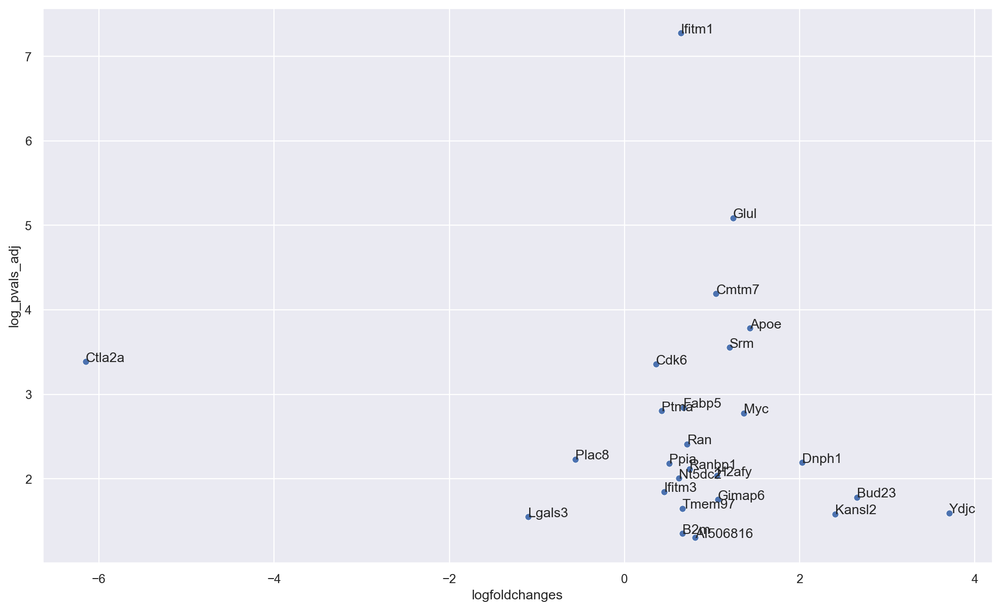

In [49]:
import matplotlib.pylab as plt
from matplotlib.pyplot import rc_context
import seaborn as sns
sc.settings.set_figure_params(dpi=80, facecolor='white')

sns.set(rc={"figure.figsize":(15, 9)})

sns.scatterplot(data=volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered, x='logfoldchanges', y= 'log_pvals_adj')
for line in range(0,volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.shape[0]):
     plt.text(volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.logfoldchanges[line], volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.log_pvals_adj[line], volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.names[line])
plt.show()

In [50]:
import gseapy
gene_set_names = gseapy.get_library_name(organism='Mouse')

In [51]:
glist_Young_transplanted_separate = sc.get.rank_genes_groups_df(Young_transplanted_separate_Ambient_RNA_cleaned_HSC, group='IL10ra_Young_transplanted_separate', key='wilcoxon_bonferroni_Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN', pval_cutoff=0.05, log2fc_min=0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_upregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [52]:
significant_terms.shape

(37, 10)

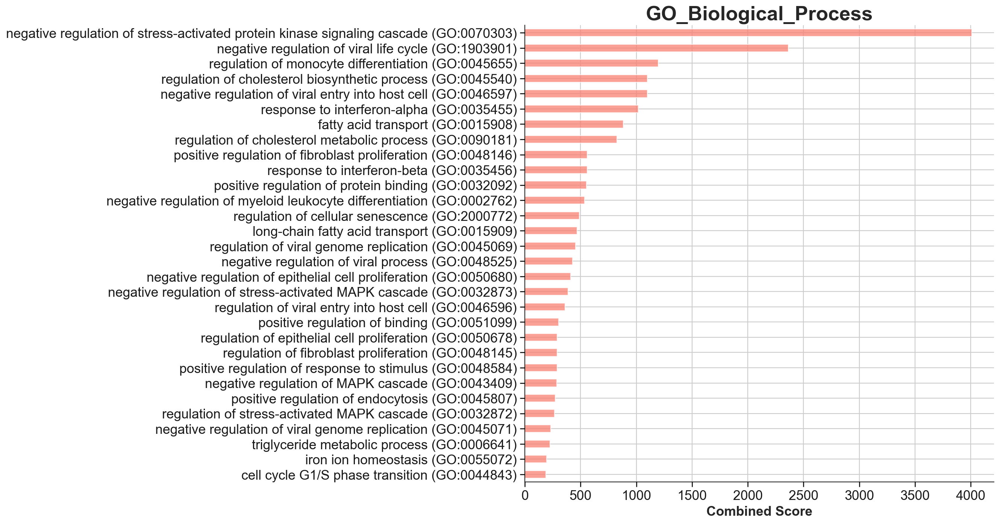

In [53]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10ra vs DN Upregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

In [54]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_upregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
2022-05-05 12:39:19,276 Warning: No enrich terms using library GO_Molecular_Function_2021 when cutoff = 0.05


In [55]:
significant_terms.shape

(0, 10)

In [56]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10ra vs DN Upregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

IndexError: index 0 is out of bounds for axis 0 with size 0

In [57]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_upregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
2022-05-05 12:39:50,944 Warning: No enrich terms using library GO_Cellular_Component_2021 when cutoff = 0.05


In [58]:
significant_terms.shape

(0, 10)

In [59]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10ra vs DN Upregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

IndexError: index 0 is out of bounds for axis 0 with size 0

In [60]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_upregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [61]:
significant_terms.shape

(5, 10)

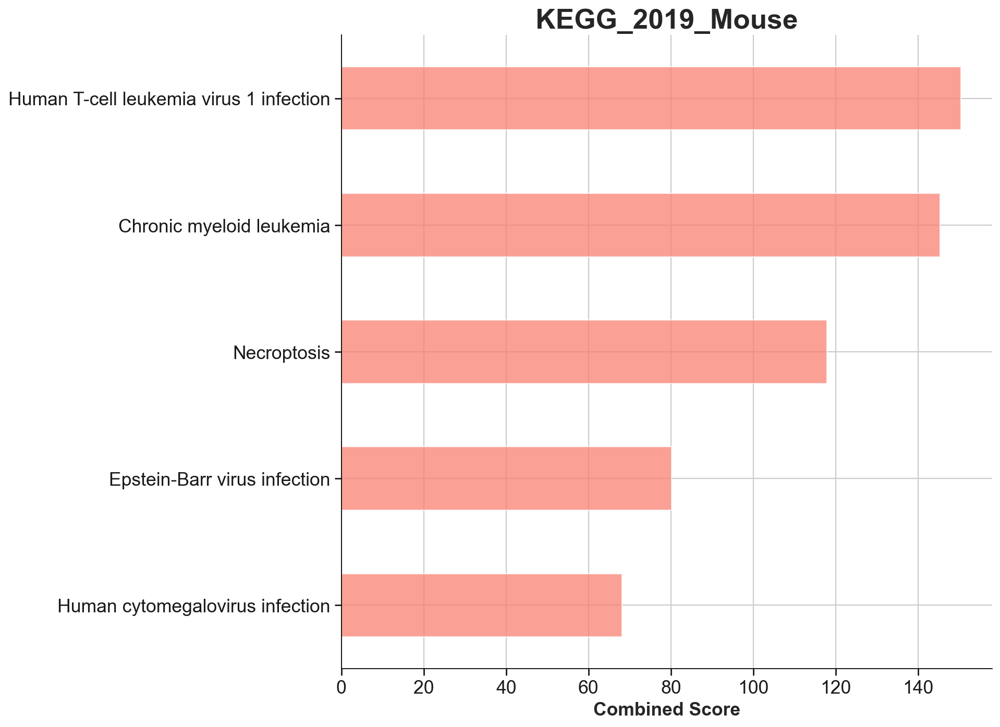

In [62]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10ra vs DN Upregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

In [63]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_upregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [64]:
significant_terms.shape

(4, 10)

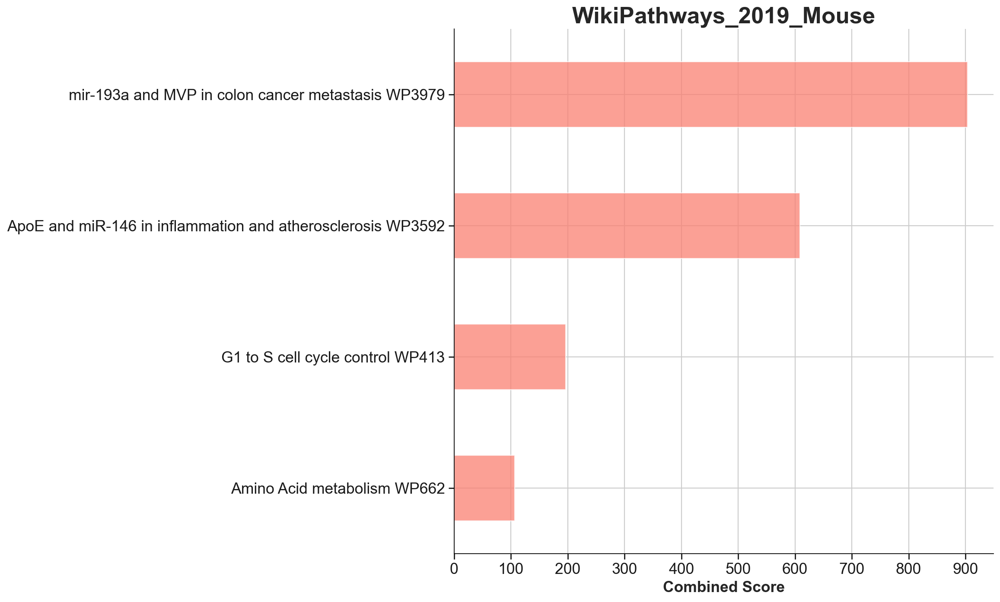

In [65]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10ra vs DN Upregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))

In [66]:
glist_Young_transplanted_separate = sc.get.rank_genes_groups_df(Young_transplanted_separate_Ambient_RNA_cleaned_HSC, group='IL10ra_Young_transplanted_separate', key='wilcoxon_bonferroni_Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN', pval_cutoff=0.05, log2fc_max=-0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_downregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [67]:
significant_terms.shape

(58, 10)

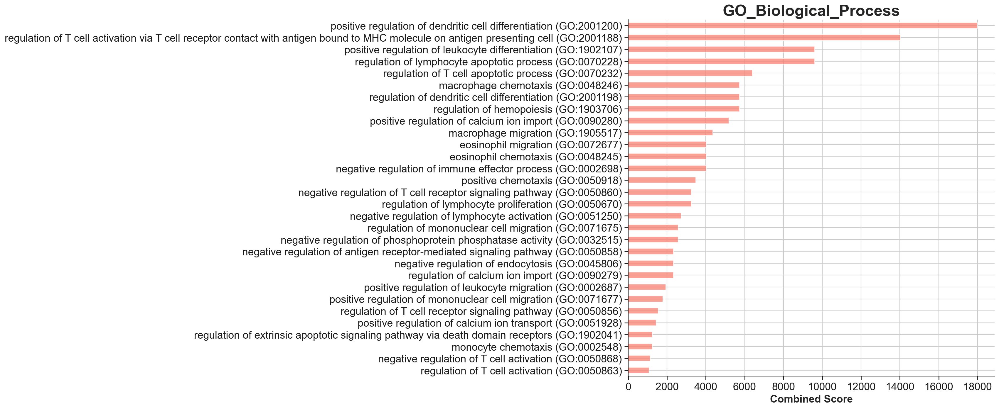

In [68]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10ra vs DN Downregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

In [69]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_downregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [70]:
significant_terms.shape

(6, 10)

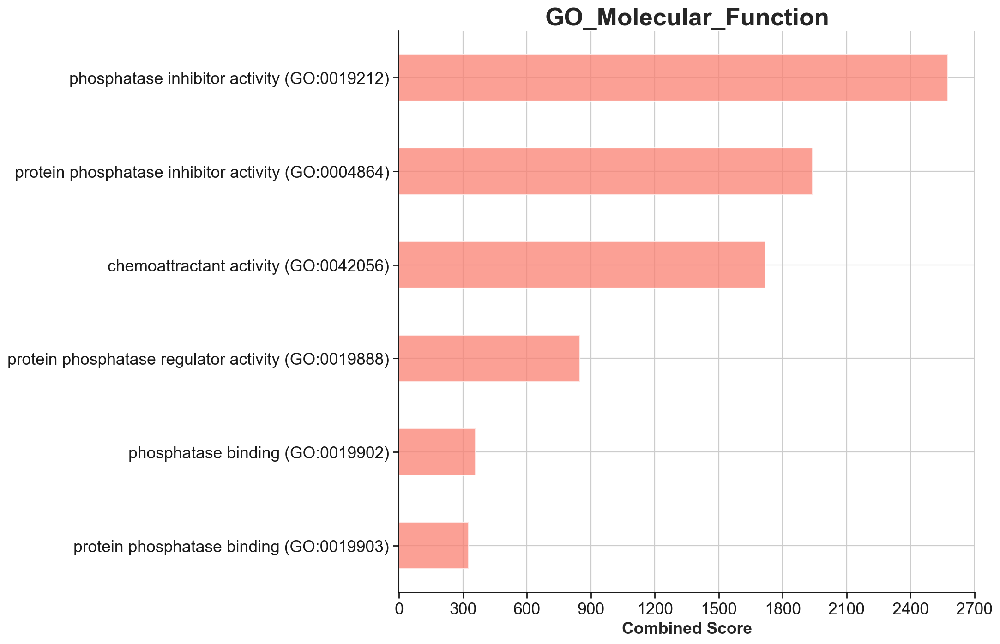

In [71]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10ra vs DN Downregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

In [72]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_downregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
2022-05-05 12:40:15,767 Warning: No enrich terms using library GO_Cellular_Component_2021 when cutoff = 0.05


In [73]:
significant_terms.shape

(0, 10)

In [74]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10ra vs DN Downregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

IndexError: index 0 is out of bounds for axis 0 with size 0

In [75]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_downregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
2022-05-05 12:40:25,194 Warning: No enrich terms using library KEGG_2019_Mouse when cutoff = 0.05


In [76]:
significant_terms.shape

(0, 10)

In [77]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10ra vs DN Downregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

TypeError: no numeric data to plot

In [78]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_downregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
2022-05-05 12:40:35,941 Warning: No enrich terms using library WikiPathways_2019_Mouse when cutoff = 0.05


In [79]:
significant_terms.shape

(0, 10)

In [80]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10ra vs DN Downregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))

TypeError: no numeric data to plot

In [81]:
sc.tl.rank_genes_groups(Young_transplanted_separate_Ambient_RNA_cleaned_HSC, 'IL10', groups = ['IL10_Young_transplanted_separate'], reference = 'DN_Young_transplanted_separate', method='wilcoxon', corr_method='bonferroni', key_added = 'wilcoxon_bonferroni_Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN', use_raw=False)
result = Young_transplanted_separate_Ambient_RNA_cleaned_HSC.uns['wilcoxon_bonferroni_Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals', 'pvals_adj']}).head(10)

,IL10_Young_transplanted_separate_n,IL10_Young_transplanted_separate_p
0,Cd79b,0.041593
1,Ctss,0.640239
2,Slc3a2,1.000000
3,Ighm,1.000000
4,Rexo2,1.000000
5,Cd74,1.000000
6,Neat1,1.000000
7,Mt1,1.000000
8,Fos,1.000000
9,Rabgap1l,1.000000


In [82]:
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC = sc.get.rank_genes_groups_df(Young_transplanted_separate_Ambient_RNA_cleaned_HSC, group=None, key='wilcoxon_bonferroni_Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN')
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR_beforehand.csv")

In [83]:
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered = volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC[volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC['pvals_adj'] < 0.05]
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered['log_pvals_adj'] = -np.log10(volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered['pvals_adj'])
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.reset_index(inplace=True, drop=True)
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN_005_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR_beforehand.csv")
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered

/tmp/ipykernel_1223941/3875304928.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered['log_pvals_adj'] = -np.log10(volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered['pvals_adj'])


,names,scores,logfoldchanges,pvals,pvals_adj,log_pvals_adj
0,Cd79b,4.301701,NaN,0.000017,0.041593,1.380977
1,Spc25,-4.268465,0.857025,0.000020,0.048300,1.316050
2,Mcm3,-4.280505,1.356250,0.000019,0.045760,1.339517
3,Racgap1,-4.287930,1.360973,0.000018,0.044257,1.354021
4,Pbk,-4.294275,0.886527,0.000018,0.043010,1.366430
5,Ube2c,-4.296150,1.038415,0.000017,0.042648,1.370100
6,Znrd2,-4.297159,NaN,0.000017,0.042454,1.372077
7,Asf1b,-4.312011,0.845347,0.000016,0.039700,1.401210
8,Cdca3,-4.327944,0.934995,0.000015,0.036935,1.432567
9,Rrm2,-4.340200,0.878644,0.000014,0.034933,1.456760


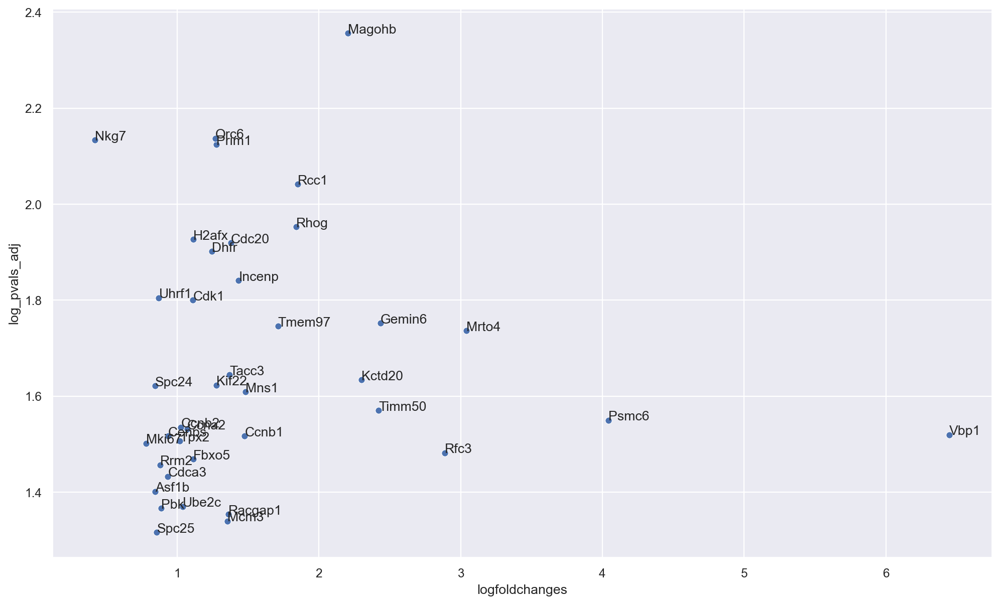

In [84]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

sns.set(rc={"figure.figsize":(15, 9)})

sns.scatterplot(data=volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered, x='logfoldchanges', y= 'log_pvals_adj')
for line in range(0,volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.shape[0]):
     plt.text(volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.logfoldchanges[line], volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.log_pvals_adj[line], volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.names[line])
plt.show()

In [85]:
import gseapy
gene_set_names = gseapy.get_library_name(organism='Mouse')

In [86]:
glist_Young_transplanted_separate = sc.get.rank_genes_groups_df(Young_transplanted_separate_Ambient_RNA_cleaned_HSC, group='IL10_Young_transplanted_separate', key='wilcoxon_bonferroni_Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN', pval_cutoff=0.05, log2fc_min=0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN_significantly_upregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [87]:
significant_terms.shape

(71, 10)

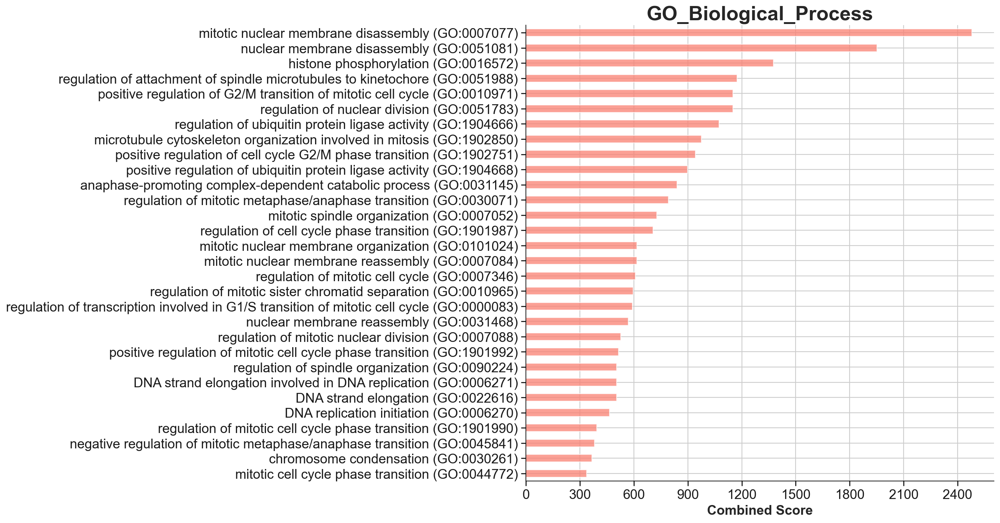

In [88]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs DN Upregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

In [89]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN_significantly_upregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [90]:
significant_terms.shape

(6, 10)

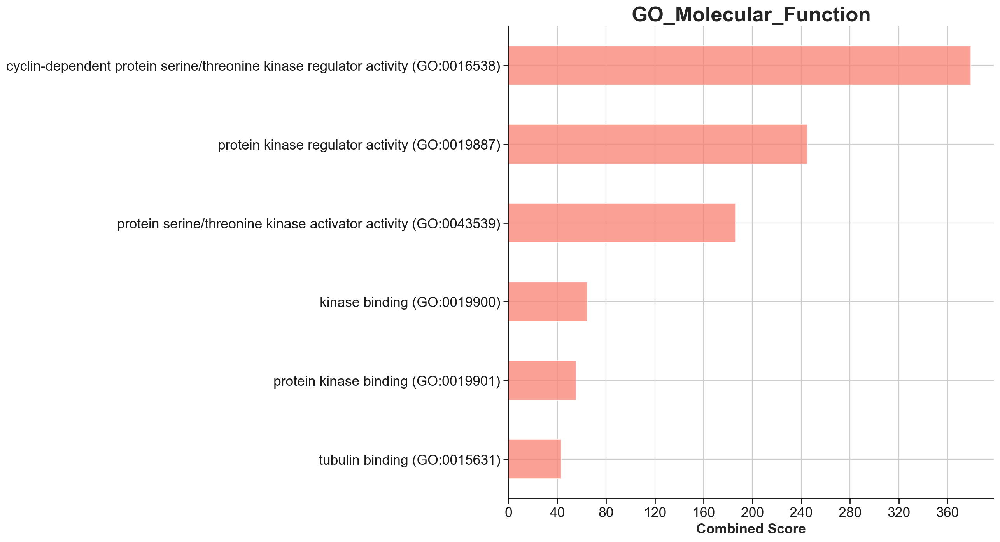

In [91]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs DN Upregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

In [92]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN_significantly_upregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [93]:
significant_terms.shape

(15, 10)

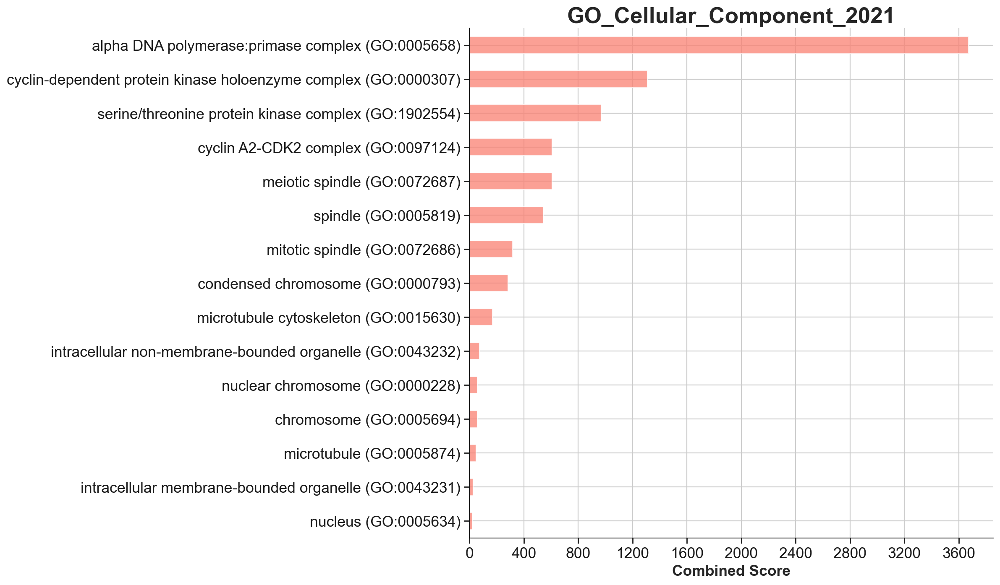

In [94]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs DN Upregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

In [95]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN_significantly_upregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [96]:
significant_terms.shape

(10, 10)

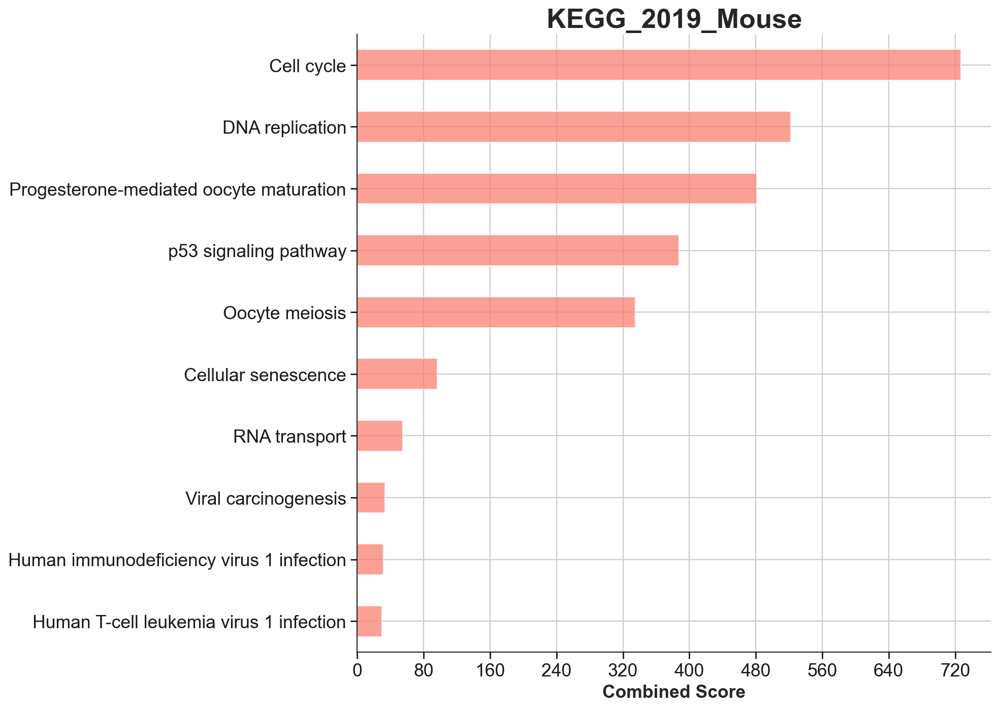

In [97]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs DN Upregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

In [98]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN_significantly_upregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [99]:
significant_terms.shape

(6, 10)

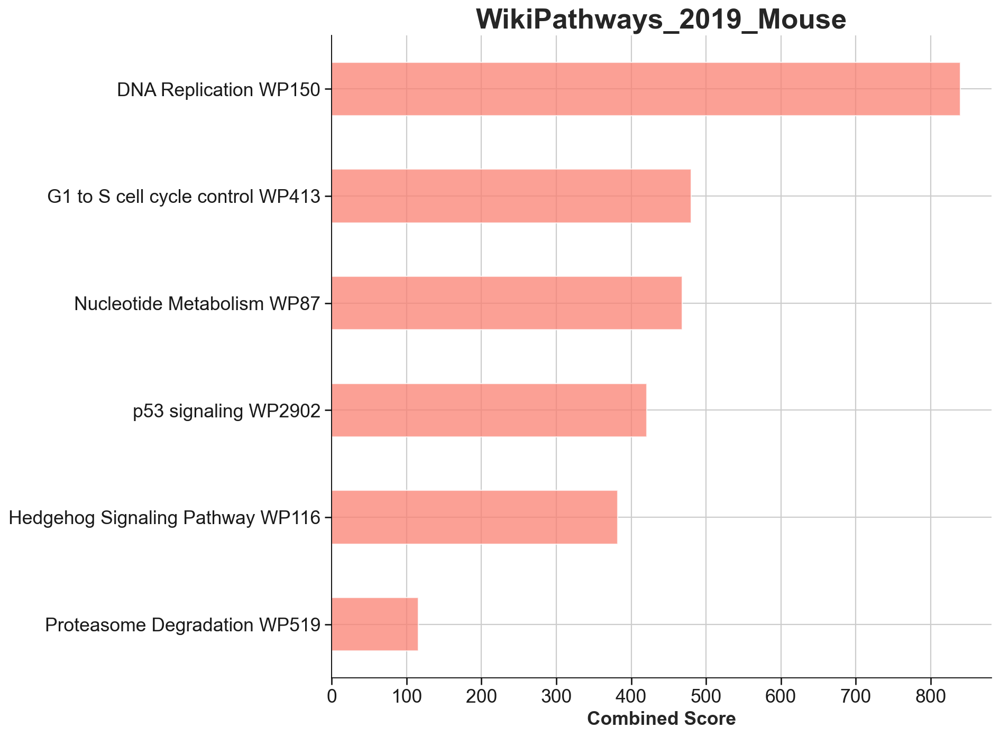

In [100]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs DN Upregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))

In [101]:
glist_Young_transplanted_separate = sc.get.rank_genes_groups_df(Young_transplanted_separate_Ambient_RNA_cleaned_HSC, group='IL10_Young_transplanted_separate', key='wilcoxon_bonferroni_Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN', pval_cutoff=0.05, log2fc_max=-0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN_significantly_downregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

Exception: Error analyzing gene list

In [ ]:
significant_terms.shape

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs DN Downregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

In [ ]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN_significantly_downregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs DN Downregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

In [ ]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN_significantly_downregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs DN Downregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

In [ ]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN_significantly_downregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs DN Downregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

In [ ]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_DN_significantly_downregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs DN Downregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))

In [102]:
sc.tl.rank_genes_groups(Young_transplanted_separate_Ambient_RNA_cleaned_HSC, 'IL10', groups = ['IL10_Young_transplanted_separate'], reference = 'IL10ra_Young_transplanted_separate', method='wilcoxon', corr_method='bonferroni', key_added = 'wilcoxon_bonferroni_Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra', use_raw=False)
result = Young_transplanted_separate_Ambient_RNA_cleaned_HSC.uns['wilcoxon_bonferroni_Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals', 'pvals_adj']}).head(10)

,IL10_Young_transplanted_separate_n,IL10_Young_transplanted_separate_p
0,Cd79b,0.097096
1,Slc3a2,0.759215
2,Rexo2,1.000000
3,Rabgap1l,1.000000
4,Fos,1.000000
5,Ctss,1.000000
6,Cd74,1.000000
7,Txndc5,1.000000
8,Mt1,1.000000
9,Cd37,1.000000


In [103]:
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC = sc.get.rank_genes_groups_df(Young_transplanted_separate_Ambient_RNA_cleaned_HSC, group=None, key='wilcoxon_bonferroni_Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra')
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR_beforehand.csv")

In [104]:
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered = volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC[volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC['pvals_adj'] < 0.05]
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered['log_pvals_adj'] = -np.log10(volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered['pvals_adj'])
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.reset_index(inplace=True, drop=True)
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra_005_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR_beforehand.csv")
volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered

/tmp/ipykernel_1223941/3682923289.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered['log_pvals_adj'] = -np.log10(volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered['pvals_adj'])


,names,scores,logfoldchanges,pvals,pvals_adj,log_pvals_adj
0,Prim1,-4.277556,1.078215,0.000019,0.046370,1.333764
1,Psmd12,-4.282344,NaN,0.000018,0.045383,1.343106
2,Magohb,-4.354155,1.931270,0.000013,0.032781,1.484380
3,Wdr1,-4.363730,3.710303,0.000013,0.031378,1.503379
4,H2afx,-4.363730,1.007345,0.000013,0.031378,1.503379
5,Glrx3,-4.382879,NaN,0.000012,0.028741,1.541491
6,Rpl7,-4.430754,NaN,0.000009,0.023044,1.637440
7,Urod,-4.512140,NaN,0.000006,0.015749,1.802747
8,Rhog,-4.732361,2.651391,0.000002,0.005446,2.263922


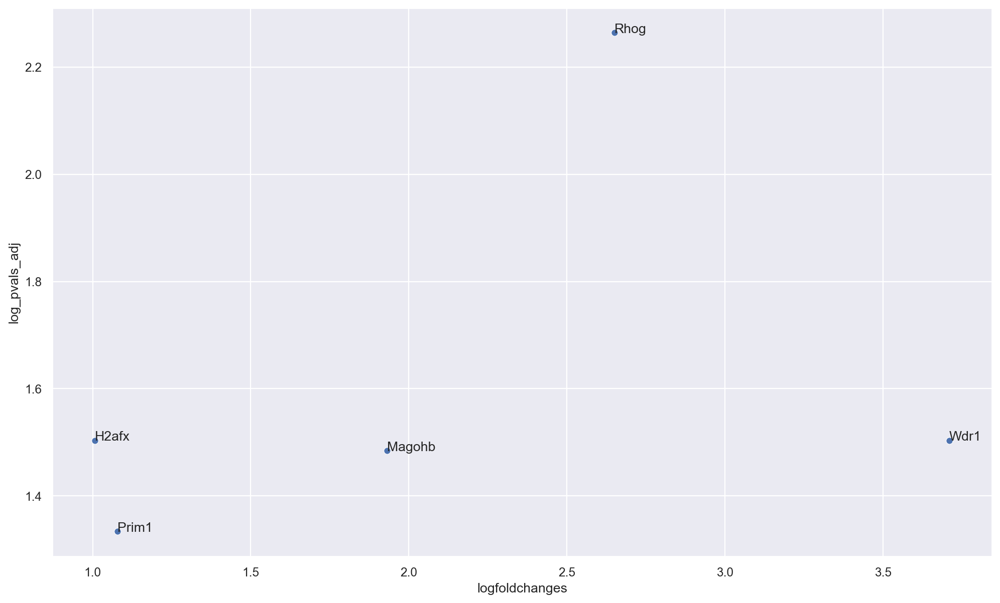

In [105]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

sns.set(rc={"figure.figsize":(15, 9)})

sns.scatterplot(data=volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered, x='logfoldchanges', y= 'log_pvals_adj')
for line in range(0,volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.shape[0]):
     plt.text(volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.logfoldchanges[line], volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.log_pvals_adj[line], volcano_Young_transplanted_separate_Ambient_RNA_cleaned_HSC_filtered.names[line])
plt.show()

In [106]:
import gseapy
gene_set_names = gseapy.get_library_name(organism='Mouse')

In [107]:
glist_Young_transplanted_separate = sc.get.rank_genes_groups_df(Young_transplanted_separate_Ambient_RNA_cleaned_HSC, group='IL10_Young_transplanted_separate', key='wilcoxon_bonferroni_Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra', pval_cutoff=0.05, log2fc_min=0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_upregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [108]:
significant_terms.shape

(56, 10)

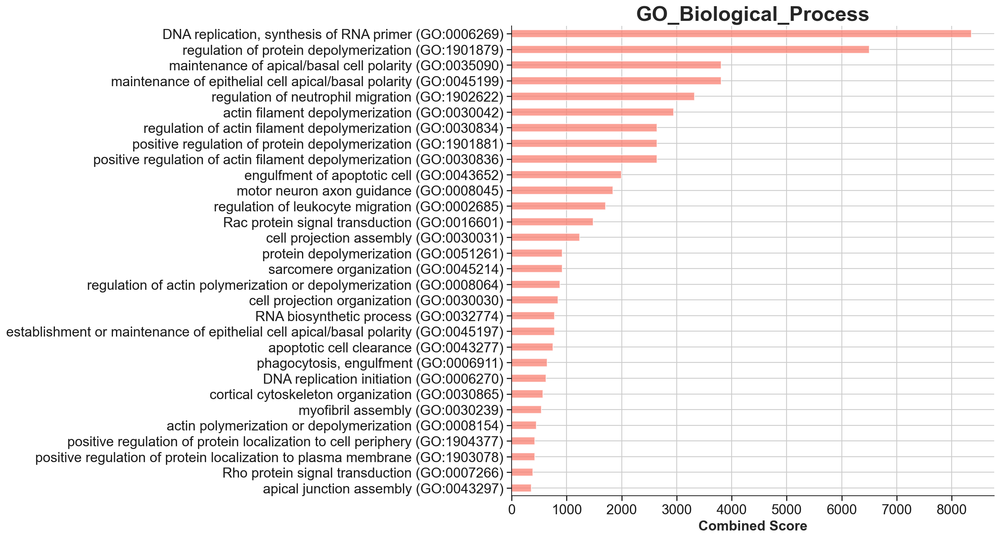

In [109]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs IL10ra Upregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

In [110]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_upregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
2022-05-05 12:41:23,126 Warning: No enrich terms using library GO_Molecular_Function_2021 when cutoff = 0.05


In [111]:
significant_terms.shape

(0, 10)

In [112]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs IL10ra Upregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

IndexError: index 0 is out of bounds for axis 0 with size 0

In [113]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_upregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [114]:
significant_terms.shape

(6, 10)

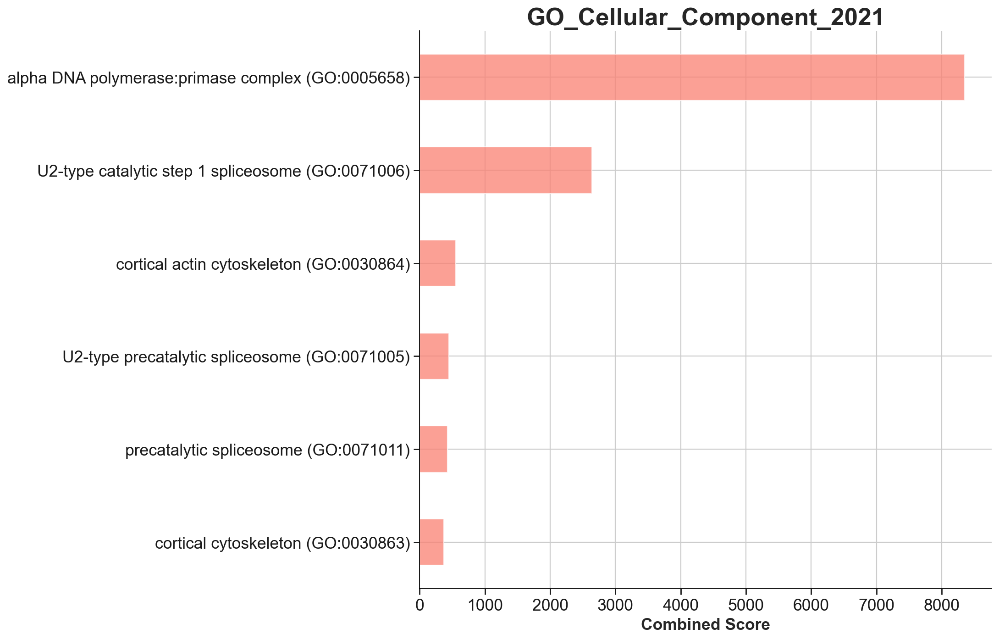

In [115]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs IL10ra Upregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

In [116]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_upregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [117]:
significant_terms.shape

(9, 10)

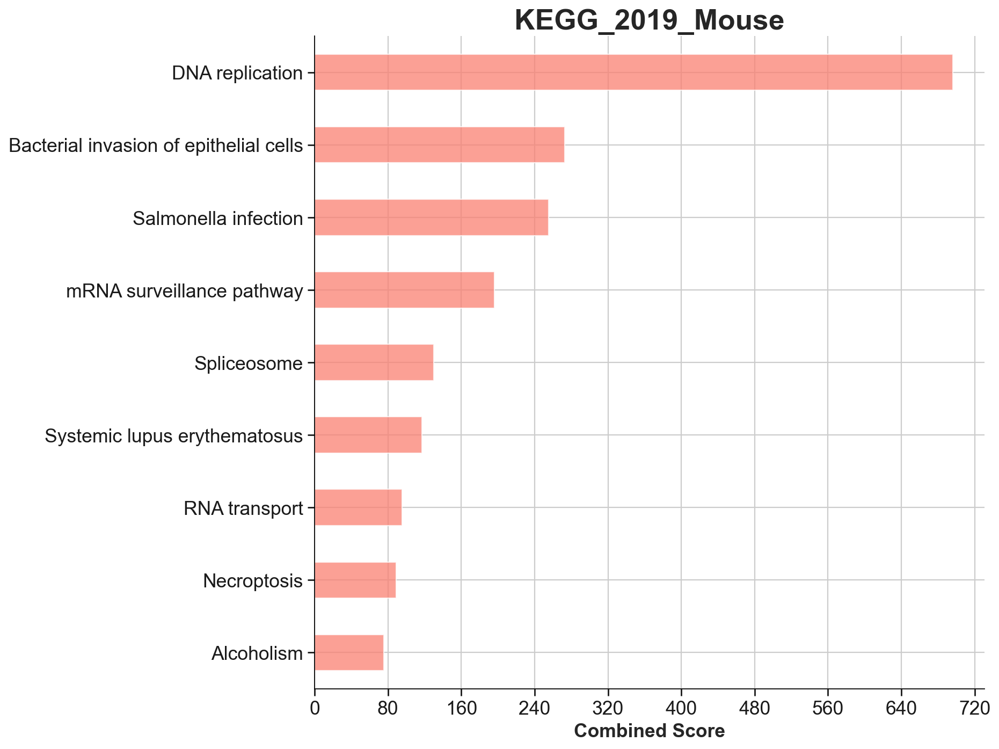

In [118]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs IL10ra Upregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

In [119]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_upregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [120]:
significant_terms.shape

(5, 10)

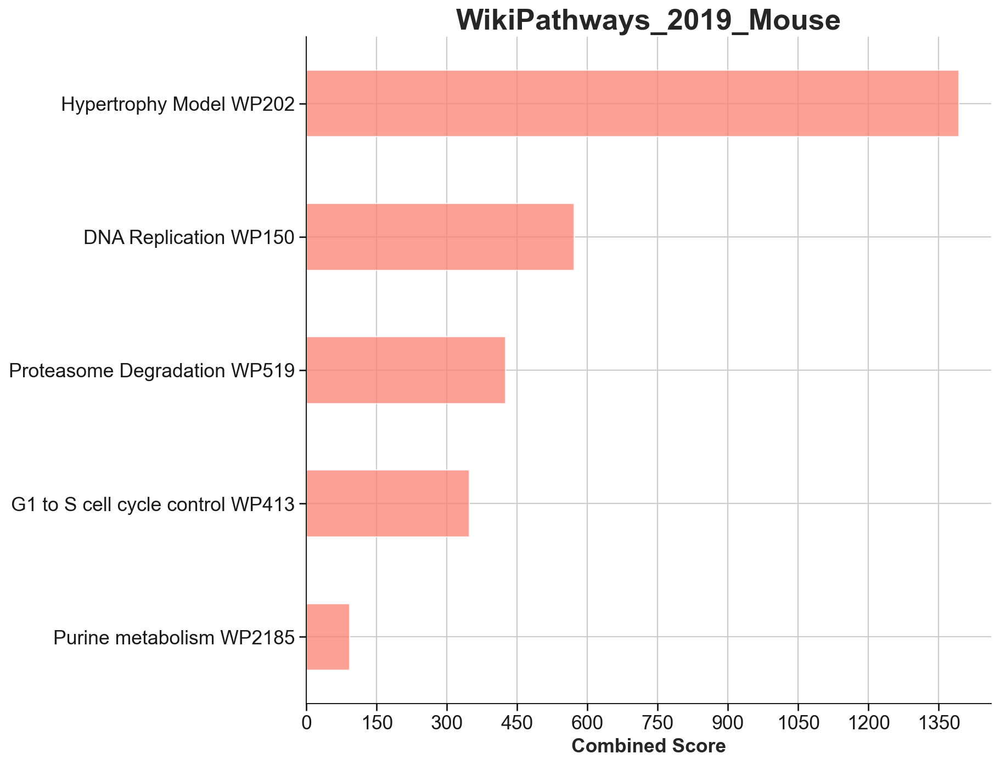

In [121]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs IL10ra Upregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))

In [122]:
glist_Young_transplanted_separate = sc.get.rank_genes_groups_df(Young_transplanted_separate_Ambient_RNA_cleaned_HSC, group='IL10_Young_transplanted_separate', key='wilcoxon_bonferroni_Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra', pval_cutoff=0.05, log2fc_max=-0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_downregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

Exception: Error analyzing gene list

In [123]:
significant_terms.shape

(5, 10)

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs IL10ra Downregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

In [ ]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_downregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs IL10ra Downregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

In [ ]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_downregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs IL10ra Downregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

In [ ]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_downregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs IL10ra Downregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

In [ ]:
enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Young_transplanted_separate, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Young_transplanted_separate_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_transplanted_separate/write/Ambient_RNA_Cleaned/Young_transplanted_separate_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_downregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young transplanted separate IL10 vs IL10ra Downregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))